<a href="https://colab.research.google.com/github/Slautin/Seed-effect-2024/blob/main/Seed_effect_2024_Sampling_models_and_AE_simulations.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Seed effect
January 2024

**Unraveling the Impact of Initial Choices and In-Loop Interventions on Learning Dynamics in Autonomous Scanning Probe Microscopy**

* Analisys [Boris Slautin](https://scholar.google.com/citations?hl=ru&view_op=list_works&gmla=AH70aAU_JtxEIQgg_RTLPnUSZHKp1J1iDrJUxTZ7Dzw5p5jEtCEug5zMWLCh4A-pe5ekW_9a_aXHOSIjEp-2UT_kypL9DfD7GcD76qEpeOzSkAibBjmm_7RL&user=Y2AXABsAAAAJ), [Yongtao Liu](https://scholar.google.com/citations?user=V9FMPgQAAAAJ&hl=en)
* Project lead and supervision by [Sergei V. Kalinin](https://scholar.google.com/citations?hl=en&user=-cuxoSQAAAAJ&view_op=list_works&sortby=pubdate)
* PTO sample provided by [Hiroshi Funakubo](https://scholar.google.co.jp/citations?user=12EJj9gAAAAJ&hl=ja)


In this Jupyter notebook, we introduced seed sampling models and initiated a simulation of Deep Kernel Learning Bayesian Optimization (DKL BO) experiments. Our goal is to uncover the impact of the 'seed effect' and in-loop interventions on the experiment's progression.  

In [1]:
!pip install --upgrade --no-cache-dir gdown==4.6.0
!pip install --upgrade git+https://github.com/ziatdinovmax/atomai.git
!pip install --upgrade git+https://github.com/ziatdinovmax/pyroved.git

  Attempting uninstall: gdown
    Found existing installation: gdown 4.7.3
    Uninstalling gdown-4.7.3:
      Successfully uninstalled gdown-4.7.3
  Cloning https://github.com/ziatdinovmax/atomai.git to /tmp/pip-req-build-s8m1plvw
  Running command git clone --filter=blob:none --quiet https://github.com/ziatdinovmax/atomai.git /tmp/pip-req-build-s8m1plvw
  Resolved https://github.com/ziatdinovmax/atomai.git to commit ef9130dfccf37d13147509b9501fa8a47a8fb3c1
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.1/193.1 kB 5.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 266.1/266.1 kB 21.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.6/175.6 kB 23.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 45.8 MB/s eta 0:00:00
  Created wheel for atomai: filename=atomai-0.7.8-py3-none-any.whl size=162552 sha256=6502320b9e6e6386179f0cd71f59f724fb8d329387

In [34]:
#import packages
import numpy as np
import matplotlib.pyplot as plt

import torch
import atomai as aoi
from atomai import utils

import pyroved as pv
from sklearn.neighbors import KernelDensity
from scipy.spatial import KDTree

from IPython.display import clear_output

import os
import pickle

##  1. Load data

In [61]:
!gdown https://drive.google.com/file/d/1vJX_SwkxUF9RVYB9DhliKAljqI9lwGg7/view?usp=sharing --fuzzy

Downloading...
From: https://drive.google.com/uc?id=1vJX_SwkxUF9RVYB9DhliKAljqI9lwGg7
To: /content/Seed_intervention/exclusion/mlt_train_seed_interv_GD/PTO_BEPS_3um.npz
100% 62.1M/62.1M [00:01<00:00, 40.2MB/s]


In [62]:
BEPS = np.load(r'PTO_BEPS_3um.npz', 'r+')

# DKL inputs
amp   = BEPS['Image_Amplitude'].astype(np.float64)
pha   = BEPS["Image_Phase"].astype(np.float64)
freq  = BEPS["Image_Frequency"].astype(np.float64)
q     = BEPS["Image_Q_Factor"].astype(np.float64)
pola  = amp * np.cos(pha)
# DKL targets
A_on  = BEPS['Image_On_Field_Loop_Area']
A_off = BEPS['Image_Off_Field_Loop_Area']
Cf    = BEPS['Image_Average_Coercive_Field']
width = BEPS['Image_Loop_Width']
DC    = BEPS['Spectra_DC_Voltage']
spec  = BEPS['Spectra_Off_Field_Loop']

In [63]:
size_nm = 3000 #scan size
scale = amp.shape[0] / size_nm

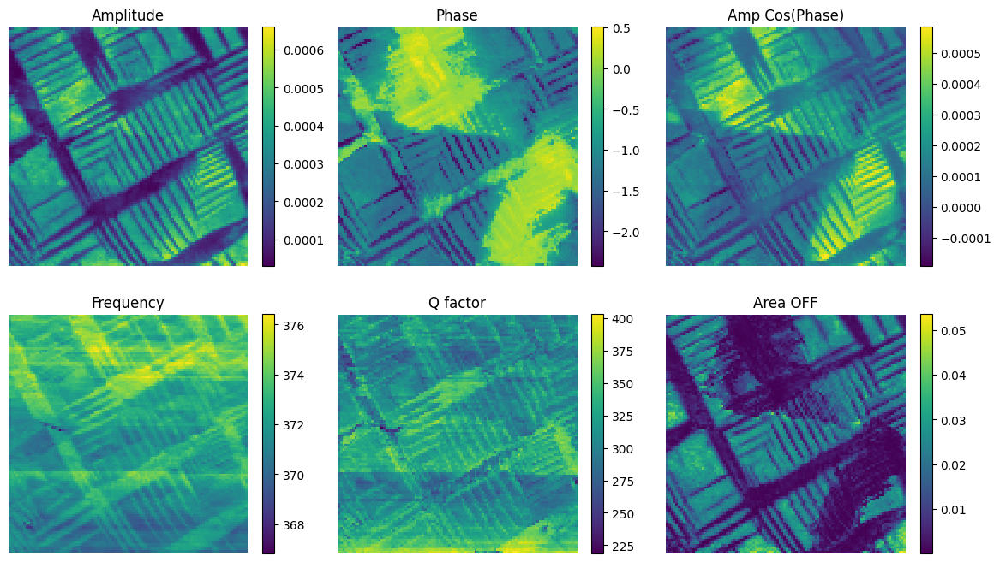

In [64]:
fig, axs = plt.subplots(2, 3, figsize=(12, 7))
fig.subplots_adjust(left=0.02, bottom=0.06, right=0.95, top=0.94, wspace=0.1)
# Make 4 subplots:
cm = 'viridis'
shrink = 1

im1 = axs[0, 0].imshow(amp, interpolation='nearest', cmap=cm, origin='lower')
fig.colorbar(im1, ax=axs[0, 0], shrink = shrink)
axs[0, 0].set_title("Amplitude")
axs[0, 0].axis('off')

im2 = axs[0, 1].imshow(pha, interpolation='nearest', cmap=cm, origin='lower')
fig.colorbar(im2, ax=axs[0, 1], shrink = shrink)
axs[0, 1].set_title("Phase")
axs[0, 1].axis('off')

im3 = axs[0, 2].imshow(pola, interpolation='nearest', cmap=cm, origin='lower')
fig.colorbar(im3, ax=axs[0, 2], shrink = shrink)
axs[0, 2].set_title("Amp Cos(Phase)")
axs[0, 2].axis('off')

im4 = axs[1, 0].imshow(freq/1000, interpolation='nearest', cmap=cm, origin='lower')
fig.colorbar(im4, ax=axs[1, 0], shrink = shrink)
axs[1, 0].set_title("Frequency")
axs[1, 0].axis('off')

im5 = axs[1, 1].imshow(q, interpolation='nearest', cmap=cm, origin='lower')
fig.colorbar(im5, ax=axs[1, 1], shrink = shrink)
axs[1, 1].set_title("Q factor")
axs[1, 1].axis('off')

im6 = axs[1, 2].imshow(A_off, interpolation='nearest', cmap=cm, origin='lower')
fig.colorbar(im6, ax=axs[1, 2], shrink = shrink)
axs[1, 2].set_title("Area OFF")
axs[1, 2].axis('off')

plt.show()

## 2. Data preprocessing

In [7]:
#functions
normalize = lambda x: (x - x.min()) / (x.max() - x.min())

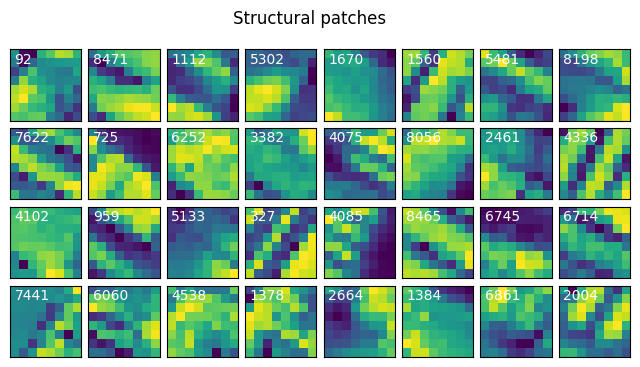

In [8]:
# Structural image patching (RCos[Phase])

#patch window size
ws = 8

# 2.1 normalize
patch_image = normalize(pola)

# 2.2. extract patches for each point on a grid
coordinates = utils.get_coord_grid(patch_image, 1)   #grid
pix = int(len(patch_image)+1-ws)
features_all, coords, _ = utils.extract_subimages(patch_image, coordinates, ws)
features_all = features_all[:,:,:,0]

#2.3 plot examples of patches
fig, axes = plt.subplots(4, 8, figsize=(8, 4),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.1))

fig.suptitle('Structural patches')

for ax in axes.flat:
    i = np.random.randint(len(features_all))
    ax.imshow(features_all[i], interpolation='nearest')
    ax.text(0, 1, str(i), color='white')

In [9]:
# Scalarizer (off-field loop area)
A_off = normalize(A_off)

A_off_all = np.zeros(pix*pix)

for i in range (pix*pix):
  A_off_all [i] = A_off[int(coords[i,0]), int(coords[i,1])]

A_off_all = A_off_all.reshape(-1)

In [10]:
#training dataset
n, d1, d2 = features_all.shape
X = features_all.reshape(n, d1*d2)  #training input: image patches

y_targ = A_off_all.reshape(-1)     #training target
y_targ = normalize(y_targ)

y = y_targ.reshape(-1)
X.shape, y.shape

((8649, 64), (8649,))

## 3. rVAE

In [13]:
'''
To ensure that you get the same VAE representation as in the article.

It requires for correct visualization of the latent trajectories if you would
like to import our pre-acquired data presented in the article.

'''

seed = 42
torch.manual_seed(seed);


In [14]:
#construct image stack and loader for VAE
vae_data = torch.tensor(features_all).float()
vae_loader = pv.utils.init_dataloader(vae_data, batch_size=64)

In [15]:
# train VAE using the constructed stack of subimages
in_dim = (ws, ws)

rvae_all = pv.models.iVAE(in_dim, latent_dim=2, invariances='r',
                      sampler_d='gaussian', decoder_sig=0.01, seed=42)
# Initialize SVI trainer
trainer = pv.trainers.SVItrainer(rvae_all)

# Train for n epochs:
for e in range(200):
    trainer.step(vae_loader, scale_factor=1)
    trainer.print_statistics()

Epoch: 1 Training loss: 4538.0365
Epoch: 2 Training loss: 3460.2717
Epoch: 3 Training loss: 2955.8342
Epoch: 4 Training loss: 2716.8499
Epoch: 5 Training loss: 2641.8630
Epoch: 6 Training loss: 2593.0035
Epoch: 7 Training loss: 2532.2195
Epoch: 8 Training loss: 2499.5954
Epoch: 9 Training loss: 2456.0282
Epoch: 10 Training loss: 2443.6320
Epoch: 11 Training loss: 2419.0351
Epoch: 12 Training loss: 2370.6789
Epoch: 13 Training loss: 2349.5259
Epoch: 14 Training loss: 2334.2589
Epoch: 15 Training loss: 2321.5950
Epoch: 16 Training loss: 2307.2045
Epoch: 17 Training loss: 2278.1456
Epoch: 18 Training loss: 2285.4149
Epoch: 19 Training loss: 2259.5787
Epoch: 20 Training loss: 2245.9166
Epoch: 21 Training loss: 2239.3578
Epoch: 22 Training loss: 2229.8286
Epoch: 23 Training loss: 2215.5512
Epoch: 24 Training loss: 2222.2979
Epoch: 25 Training loss: 2211.5770
Epoch: 26 Training loss: 2211.4341
Epoch: 27 Training loss: 2201.1698
Epoch: 28 Training loss: 2199.2129
Epoch: 29 Training loss: 2192

In [19]:
z_mean_all, z_sd_all = rvae_all.encode(vae_data)
z1 = z_mean_all[:, -2]
z2 = z_mean_all[:, -1]

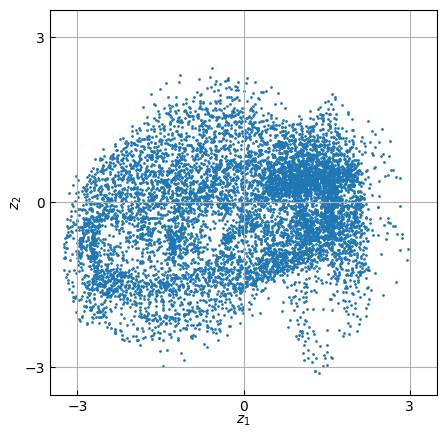

In [20]:
#latent distribution
fig = plt.figure(figsize=(5,5), dpi=100)
plt.scatter(z1, z2, s=1)

plt.xlabel("$z_1$", fontsize=10, labelpad=0.1)
plt.ylabel("$z_2$", fontsize=10, labelpad=0.1)
plt.xlim(-3.5,3.5)
plt.ylim(-3.5,3.5)
plt.xticks([-3,0,3])
plt.yticks([-3,0,3])
plt.tick_params('both', direction='in', labelsize=10)
plt.grid()

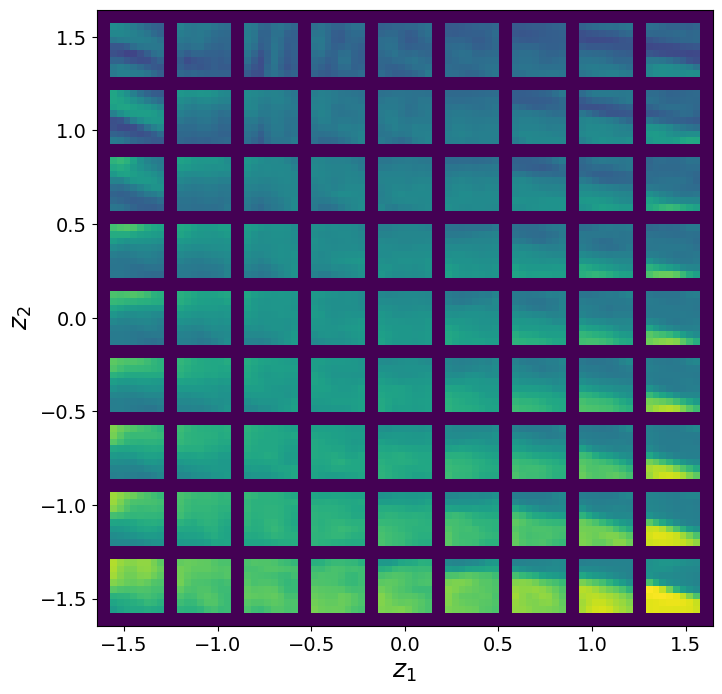

In [21]:
rvae_all.manifold2d(9, dpi = 100, cmap = 'viridis');

## 4. Seed sampling models

In [70]:
# 4.1 functions

# define a function to get the nearest latents to kde samples
def nearest_latents (latent1, latent2, samples):
    """
    Find the indices of the nearest points in latent1 and latent2 for each sample in the 'samples' set.

    Parameters:
    - latent1 (numpy.ndarray): Latent variable values for the first dimension.
    - latent2 (numpy.ndarray): Latent variable values for the second dimension.
    - samples (numpy.ndarray): Array of samples for which nearest latent points are to be found.

    Returns:
    - numpy.ndarray: Array of indices corresponding to the nearest latent points for each sample.
    """
    # Combine latent1 and latent2 into a 2D array
    ar = np.c_[latent1, latent2]

    # Initialize an array to store indices of nearest points
    idx = np.zeros(len(samples[0]))

    # Build a KD-tree for efficient nearest neighbor search
    tree = KDTree(ar)

    # Iterate over each sample to find its nearest latent points
    for i in range(len(samples[0])):
        # Query the KD-tree to find the 10 nearest points and select the first one not already in 'idx'
        id = tree.query(samples[:, i], k=10)[1]
        for _ in id:
            if _ not in idx:
                idx[i] = _
                break

    return idx

def kde(latent1, latent2, target_l1, target_l2, sample_size,
        kde_kernel='gaussian', seed=None, bandwidth='scott'):
    """
    Generate samples using Kernel Density Estimation (KDE) and find nearest latent points to these samples.

    Parameters:
    - latent1 (numpy.ndarray): Latent variable values for the first dimension.
    - latent2 (numpy.ndarray): Latent variable values for the second dimension.
    - target_l1 (numpy.ndarray): Latent variable values for the first dimension (target space).
    - target_l2 (numpy.ndarray): Latent variable values for the second dimension (target space).
    - sample_size (int): Number of samples to generate using KDE.
    - kde_kernel (str, optional): Kernel function for KDE. Default is 'gaussian'.
    - seed (int, optional): Seed for reproducibility. Default is None.
    - bandwidth (str or float, optional): Bandwidth estimation method or fixed bandwidth for KDE.
                                         Default is 'scott' (Scott's Rule).

    Returns:
    - Tuple[numpy.ndarray, numpy.ndarray]: A tuple containing generated KDE samples and indices of nearest latent
                                          points in the target space for each KDE sample.
    """
    # Combine latent1 and latent2 into a 2D array
    xy_arr = np.c_[latent1, latent2]

    # Fit a Kernel Density Estimation model using provided kernel and bandwidth
    _kde = KernelDensity(kernel=kde_kernel, bandwidth=bandwidth).fit(xy_arr)

    # Generate samples using KDE
    kde_samples = _kde.sample(n_samples=sample_size, random_state=seed)

    # Find the nearest latent points in the target space for each KDE sample
    idx = nearest_latents(target_l1, target_l2, kde_samples.T)

    return kde_samples, idx

def sampling(z1, z2, z1z2_uni, z1_uni, z2_uni, seed_size):
  """
    Performs sampling based on kernel density estimation (KDE) for three different scenarios.

    Parameters:
    - z1 (array): Data for the first variable of GD policy.
    - z2 (array): Data for the second variable of GD policy.
    - z1z2_uni (array): Data for the UD policy.
    - z1_uni (array): Data for the first variable for ULS policy.
    - z2_uni (array): Data for the second variable for ULS policy.
    - seed_size (int): The size of the seed for sampling.

    Returns:
    - kde_seed (array): Sampling by GD.
    - uni_seed (array): Sampling by UD.
    - uni_full_seed (array): Sampling by ULS.
    """

  _, idx = kde(z1, z2, z1, z2, seed_size, kde_kernel='gaussian')

  _, uni_idx = kde(z1z2_uni[0], z1z2_uni[1], z1, z2,
                          seed_size, kde_kernel='tophat')

  _, uni_full_idx = kde(z1_uni.ravel(), z2_uni.ravel(), z1, z2,
                                    seed_size, kde_kernel='tophat')


  kde_seed = (np.rint(idx)).astype(int)
  uni_seed = (np.rint(uni_idx)).astype(int)
  uni_full_seed = (np.rint(uni_full_idx)).astype(int)
  return kde_seed, uni_seed, uni_full_seed

def create_subsamplings(z1, z2, z1z2_uni, z1_uni, z2_uni, size = 20, N = 10):
  """
    Creates multiple subsamplings.

    Parameters:
    - size (int): The size of the seed for sampling.
    - N (int): The number of iterations to create subsamplings.

    Returns:
    - res (dict): A dictionary containing subsamplings for different scenarios.
  """
  res = {'GD': [], 'UD':[], 'ULS':[]}

  for _ in range(N):
    kde_seed, uni_seed, uni_full_seed = sampling(z1, z2, z1z2_uni, z1_uni, z2_uni, size)
    res['GD'].append(kde_seed)
    res['UD'].append(uni_seed)
    res['ULS'].append(uni_full_seed)

  return res

#forensic function
def ind_by_coord(points_coord, coord_array):
  res = list()
  for point in points_coord:
     _comparison = np.all(coord_array == point, axis=1)
     res.append(np.where(_comparison)[0][0])
  return np.array(res)

In [23]:
# 4.2 construct probability models

ext = 2 #extension of latent space (LS)

z1min, z1max, z2min, z2max = float(z1.min()), float(z1.max()), float(z2.min()), float(z2.max())

#LS field
z_x, z_y = np.mgrid[z1min-ext:z1max+ext:200j, z2min-ext:z2max+ext:200j]

#all coordinates in the LS
z1z2_grid = np.vstack([z_x.ravel(), z_y.ravel()])

#coordinates po points from latent distribution in the LS
z1z2      = np.vstack([z1, z2])

#gaussian KDE for latent distribution
g_kde = KernelDensity(kernel='gaussian', bandwidth='scott').fit(z1z2.T)
gaussian = np.reshape(np.exp(g_kde.score_samples(z1z2_grid.T)), z_x.shape)

#uniform over the distr
dist_thresh = 0.2
tree = KDTree(z1z2.T)
_dist, _ind = tree.query(z1z2_grid.T, k=1)
z1z2_uni= z1z2_grid.T[_dist<dist_thresh].T

uni_kde = KernelDensity(kernel='tophat', bandwidth='scott').fit(z1z2_uni.T)
uniform = np.reshape(np.exp(uni_kde.score_samples(z1z2_grid.T)), z_x.shape)

#uniform over whole space
z1_uni, z2_uni = np.mgrid[z1min:z1max:100j, z2min:z2max:100j]
z1z2_uni2 = np.vstack([z1_uni.ravel(), z2_uni.ravel()])

uni_full_kde = KernelDensity(kernel='tophat', bandwidth='scott').fit(z1z2_uni2.T)
full_uniform = np.reshape(np.exp(uni_full_kde.score_samples(z1z2_grid.T)), z_x.shape)

Text(0, 0.5, 'Nearest points from\nlatent distribution\n$z_1$')

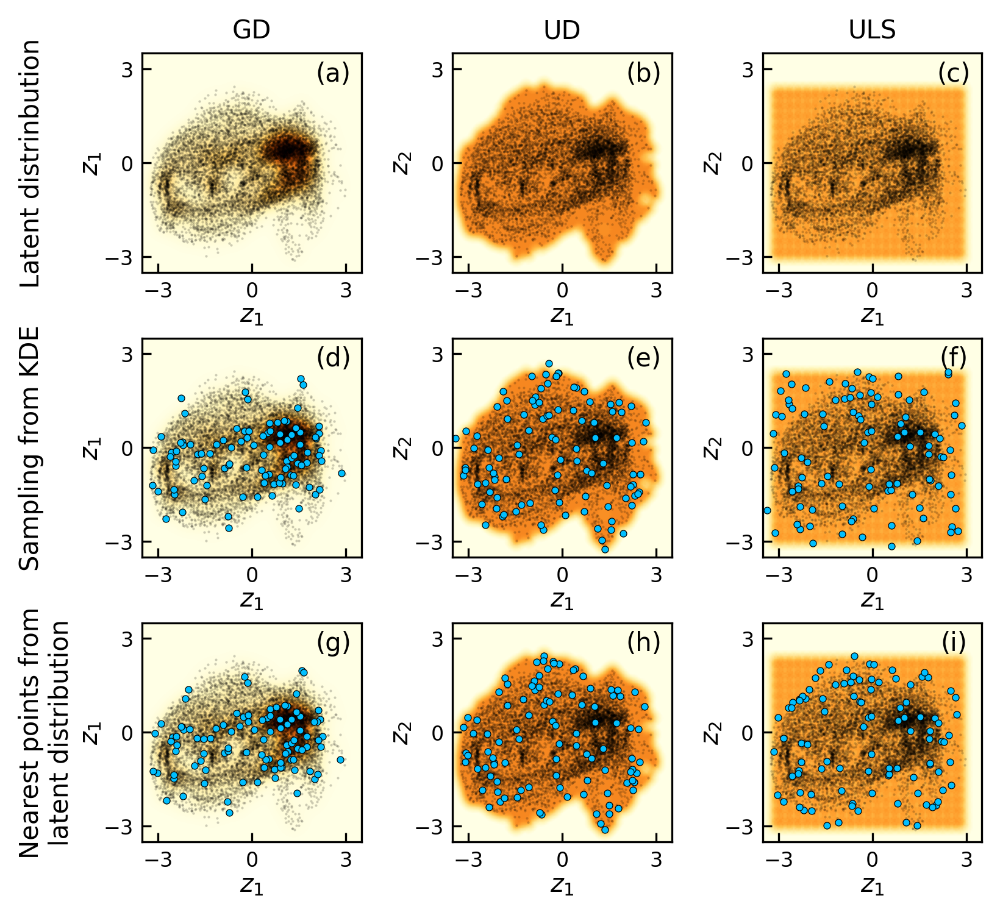

In [24]:
# 4.3 samplings

sample_size = 100

kde_sams, idx = kde (z1, z2, z1, z2, sample_size, kde_kernel='gaussian', seed =40)#40
uni_sams, uni_idx = kde (z1z2_uni[0], z1z2_uni[1], z1, z2, sample_size=sample_size, kde_kernel='tophat', seed =40)
uni_full_sams, uni_full_idx = kde (z1_uni.ravel(), z2_uni.ravel(), z1, z2, sample_size=sample_size, seed =40, kde_kernel='tophat',)

subsampling = [kde_sams, uni_sams, uni_full_sams]
idx_ = [idx, uni_idx, uni_full_idx]
letter = ['(a)','(b)','(c)', '(d)', '(e)', '(f)', '(g)', '(h)', '(i)']

fig, ax = plt.subplots(3, 3, figsize = (6.2, 5.6), dpi=300)#, constrained_layout=True)
fig.subplots_adjust(hspace=0.3)


for i, _ in enumerate(ax.flat):
  _.set_aspect('equal')
  _.set_xlabel("$z_1$", fontsize=10, labelpad=0.1)
  _.set_ylabel("$z_2$", fontsize=10, labelpad=0.1)
  _.set_xlim(-3.5,3.5)
  _.set_ylim(-3.5,3.5)
  _.set_xticks([-3,0,3])
  _.set_yticks([-3,0,3])
  _.tick_params('both', direction='in', labelsize=8)
  _.text(2.6, 2.6, s=letter[i], wrap=True, ha='center')

for _ in ax.flat:
  _.scatter(z1, z2, c='black', s=1, linewidths=0, alpha=0.2)

for _ in ax[:,0]:
  _.imshow(np.rot90(gaussian), cmap='YlOrBr',
              extent=[z1min-ext, z1max+ext, z2min-ext, z2max+ext])

for _ in ax[:,1]:
  _.imshow(np.rot90(uniform), cmap='YlOrBr', vmax=full_uniform.max()*2,
              extent=[z1min-ext, z1max+ext, z2min-ext, z2max+ext])
for _ in ax[:,2]:
  _.imshow(np.rot90(full_uniform), cmap='YlOrBr', vmax=full_uniform.max()*2,
              extent=[z1min-ext, z1max+ext, z2min-ext, z2max+ext])

for i in range(3):
  ax[1,i].scatter(subsampling[i].T[0], subsampling[i].T[1], color='deepskyblue', s=7, linewidths=0.3, edgecolor='black')
  ax[2,i].scatter(z1[idx_[i]], z2[idx_[i]], color='deepskyblue', s=7, linewidths=0.3, edgecolor='black')
ax[0,0].set_title('GD', fontsize=10)
ax[0,1].set_title('UD', fontsize=10)
ax[0,2].set_title('ULS', fontsize=10)

ax[0,0].set_ylabel('Latent distrinbution\n\n$z_1$')
ax[1,0].set_ylabel('Sampling from KDE\n\n$z_1$')
ax[2,0].set_ylabel('Nearest points from\nlatent distribution\n$z_1$')

## 5. Uncertainty VS number of seed points  

It is not a simulation of AE. Here we calculate DKL uncertainty for various seed point numbers determined using various policies.

#### Experiment

In [ ]:
paternal = os.getcwd()

#seed policies
seeds_n = ['GD', 'UD', 'ULS']

#number of simulation for statistical insight
exp_number = 5

#point numbers
start_size = 3
final_size = 15

sizes = np.arange(start_size, final_size+1)

In [ ]:
rf = "distribution_static/"

if not os.path.exists(rf):
  os.mkdir(rf)

#priors
dict_subs_all = []
for s in sizes:
  print('Current size: {}'.format(s))
  dict_subs = create_subsamplings(z1, z2, z1z2_uni, z1_uni, z2_uni, size = s, N = exp_number)
  dict_subs_all.append(dict_subs)

#simulation
for i,s in enumerate(sizes):
  print('Current size: {}'.format(s))
  os.chdir(os.path.join(paternal, rf))
  dict_subs = dict_subs_all[i]
  res = {}

  for seed in dict_subs.keys():
    print('_______ {} _______'.format(seed))
    res[seed] = []
    for samples in dict_subs[seed]:
      X_train_ = X[samples,]
      y_train_ = y_targ[samples,]
      data_dim = X_train_.shape[-1]
      dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
      dklgp.fit(X_train_, y_train_, training_cycles=200)
      mean_, var_ = dklgp.predict(X, batch_size=len(X))
      res[seed].append([mean_, var_])
      print('-------------------')
    res[seed] = np.array(res[seed])
    clear_output()
  np.savez('record_size_{}.npz'.format(s), GD = res['GD'], UD = res['UD'], ULS = res['ULS'])

os.chdir(paternal)

#### Forensic analysis

In [ ]:
os.chdir('/content')

In [ ]:
#import data
!gdown https://drive.google.com/file/d/1NatEOXhqgIQgP7V7RtyDzl0m0Q3olHtw/view?usp=sharing --fuzzy

Downloading...
From: https://drive.google.com/uc?id=1NatEOXhqgIQgP7V7RtyDzl0m0Q3olHtw
To: /content/Samplings_seed_models.zip
100% 48.7M/48.7M [00:02<00:00, 21.2MB/s]


In [ ]:
!unzip Samplings_seed_models.zip

In [ ]:
#Unfortunately, in the current version we do not save the prior for the experiment

paternal = os.getcwd()

base_folder = 'Samplings_seed_models'

#point numbers
start_size = 3
final_size = 15

sizes = np.arange(start_size, final_size+1)

In [ ]:
distr_res = {'GD':[],'UD':[],'ULS':[]}
for i in sizes:
  data = np.load(os.path.join(paternal, base_folder, f'record_size_{i}.npz'))
  distr_res['GD'].append(data['GD'])
  distr_res['UD'].append(data['UD'])
  distr_res['ULS'].append(data['ULS'])

distr_res['GD'] = np.array(distr_res['GD'])
distr_res['UD'] = np.array(distr_res['UD'])
distr_res['ULS'] = np.array(distr_res['ULS'])

Text(0.5, 0, 'Number of points')

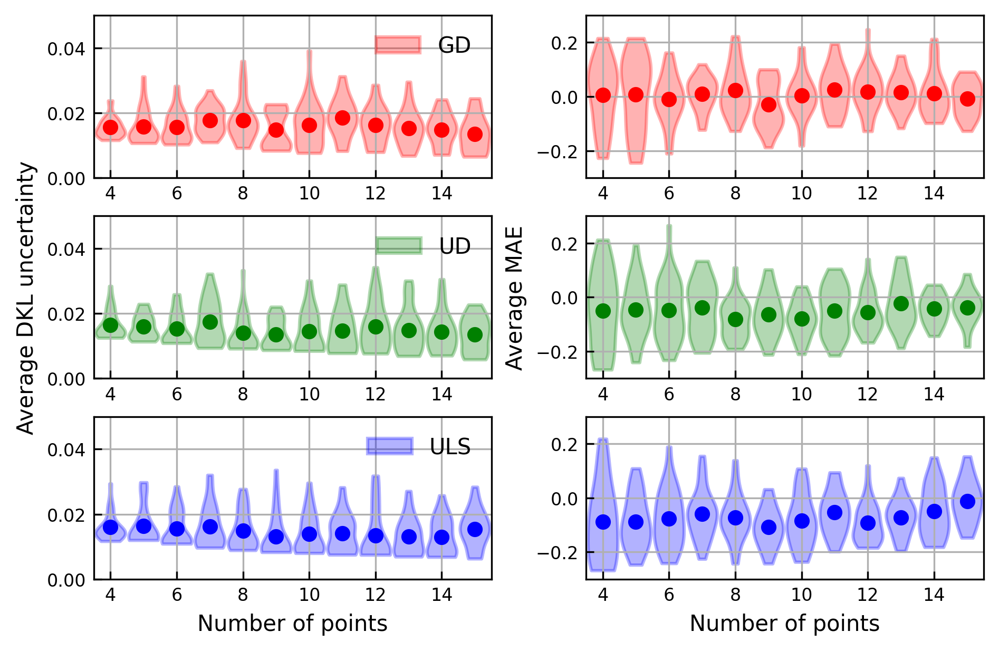

In [ ]:
colors= ['red', 'green', 'blue']
fig, ax = plt.subplots(3,2, figsize=(6.2,4), constrained_layout=True, dpi =300)
for i,seed in enumerate(distr_res):
  mean_ = distr_res[seed].mean(-1)[:,:,1].mean(1)
  std_ = distr_res[seed].mean(-1)[:,:,1].std(1)
  mse_ = np.mean(distr_res[seed][:,:,0,:]-y_targ, axis=-1)

  vp = ax[i,0].violinplot(distr_res[seed].mean(-1)[:,:,1].T, sizes, showextrema = False, showmeans=False, widths=0.9)
  violine_param(vp, facecolor=colors[i], edgecolor=colors[i], label=seed)
  ax[i,0].plot(sizes, mean_, 'o', color = colors[i])
  ax[i,0].set_ylim(0,0.05)
  ax[i,0].legend(frameon=False)

  vp = ax[i,1].violinplot(mse_.T, sizes, showextrema = False, showmeans=False, widths=0.9)
  violine_param(vp, facecolor=colors[i], edgecolor=colors[i])
  ax[i,1].set_ylim(-0.3,0.3)
  ax[i,1].plot(sizes, mse_.mean(1), 'o', color = colors[i])

for _ in ax.flat:
  _.set_xlim(3.5,15.5)
  _.tick_params('both', direction='in', labelsize=8)
  _.grid()

ax[1,0].set_ylabel('Average DKL uncertainty', fontsize=10)
ax[1,1].set_ylabel('Average MAE', fontsize=10)
ax[2,0].set_xlabel('Number of points')
ax[2,1].set_xlabel('Number of points')

## 6. Seed Effects

In [ ]:
#dkl functions
from typing import Union

def EI(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor],
       best_f: Union[float, torch.Tensor], xi: float = 0.01) -> np.ndarray:
    """
    Expected Improvement
    """
    device=model.device
    dtype = model.dtype
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    best_f = torch.from_numpy(best_f) if isinstance(best_f, float) else best_f
    posterior = model._compute_posterior(X.to(dtype).to(device))
    samples = posterior.rsample(torch.Size([1000, ]))
    mean, sigma = samples.mean(0), samples.var(0).sqrt()
    u = (mean - best_f.expand_as(mean) - xi) / sigma
    normal = torch.distributions.Normal(torch.zeros_like(u), torch.ones_like(u))
    ucdf = normal.cdf(u)
    updf = torch.exp(normal.log_prob(u))
    obj = sigma * (updf + u * ucdf)
    return obj.detach().cpu().numpy()

def UCB(model: aoi.models.dklGPR, X: Union[np.ndarray, torch.Tensor],
        beta: float = 0.2) -> np.ndarray:
    """
    Upper confidence bound
    """
    device = model.device
    dtype = model.dtype
    X = torch.from_numpy(X) if isinstance(X, np.ndarray) else X
    beta = torch.tensor(beta) if isinstance(beta, float) else beta
    posterior = model._compute_posterior(X.to(dtype).to(device))
    samples = posterior.rsample(torch.Size([1000, ]))
    mean, var = samples.mean(0), samples.var(0)
    delta = (beta.expand_as(mean).to(dtype).to(device) * var).sqrt()
    return (mean + delta).detach().cpu().numpy()

# Define a function to run DKL exploration
def dkl_explore (save_explore, num_cycles = 200):
  global X, y_targ, coords, ts, rs, rf, acq_funcs, exploration_steps, acq_idx, ws, seed
  # Here X_train and y_train are our measured image patches and spectra information,
  # whereas X_test and y_test are the "unknown" ones. The indices_train are grid coordinates of the measured points,
  # whereas the indices_test are the grid coordinates of the remaining available points on the grid
  # (X_train, X_test, y_train, y_test,
  #  indices_train, indices_test) = train_test_split(
  #      X, y, indices_all, test_size=ts, shuffle=True, random_state=rs)
  y= y_targ
  X_train = X[seed,]
  X_test = np.delete(X, seed, axis=0)
  y_train = y[seed,]
  y_test = np.delete(y, seed, axis=0)
  indices_train = coords[seed,]
  indices_test = np.delete(coords, seed, axis=0)
  print('X_train shape: '); print(X_train.shape)
  data_dim = X_train.shape[-1]

  if not os.path.exists(rf + acq_funcs[acq_idx] + save_explore):
    os.mkdir(rf + acq_funcs[acq_idx] + save_explore)
  os.chdir(rf + acq_funcs[acq_idx] + save_explore)
  np.savez("initial_traindata.npz", X_train = X_train, X_test = X_test, y_train = y_train,
           y_test = y_test, indices_train = indices_train, indices_test = indices_test)

  clear_output()
  for e in range(exploration_steps):
    clear_output()
    print("{}/{}".format(e+1, exploration_steps))
    # Update GP posterior
    dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
    dklgp.fit(X_train, y_train, training_cycles=num_cycles)

    mean, var = dklgp.predict(X, batch_size=len(X))

    # Compute acquisition function
    next_point_idx = sel_next_point (dklgp, X_train, X_test, xi)
    next_point = indices_test[next_point_idx]

    # Do "measurement"
    measured_point = y_test[next_point_idx]
    # Plot current result

    # Update train and test datasets
    (X_train, X_test, y_train, y_test, indices_train,
     indices_test) = update_train_test_data(X_train, X_test, y_train, y_test,
                                            indices_train, indices_test,
                                            next_point_idx, measured_point, next_point)

    # Save result
    np.savez("record{}.npz".format(e),
             mean = mean, var = var, next_point_idx = next_point_idx,
             next_point = next_point, measured_point = measured_point)
  # Save final traindata
  np.savez("final_traindata.npz", X_train = X_train, X_test = X_test,
           y_train = y_train, y_test = y_test,
           indices_train = indices_train, indices_test = indices_test)

# Functions for plotting result, selecting next measurement point, and update train/test dataset
def sel_next_point (dklgp, X_train, X_test, xi):
  '''
  Function selects next_point_idx based on either EI
  acquision function (0) or maximum uncertainty point (1)
  '''
  global acq_idx
  if acq_idx == 0:  # 0 uses EI function
    best_f = torch.tensor(dklgp.predict(X_train)[0].max(), device=dklgp.device)
    obj = EI(dklgp, X_test, best_f, xi)
    next_point_idx = obj.mean(0).argmax()
  elif acq_idx == 1:  # 1 explores the max uncertainty point
    mean0, var0 = dklgp.predict(X_test, batch_size=len(X_test))
    next_point_idx = var0.argmax()
  elif acq_idx == 2:  # 2 uses UCB function
    obj = UCB(dklgp, X_test)
    next_point_idx = obj.mean(0).argmax()

  return next_point_idx

def update_train_test_data(X_train, X_test, y_train, y_test,
                           indices_train, indices_test,
                           next_point_idx, measured_point, next_point):
  X_train = np.append(X_train, X_test[next_point_idx][None], 0)
  X_test = np.delete(X_test, next_point_idx, 0)
  y_train = np.append(y_train, measured_point)
  y_test = np.delete(y_test, next_point_idx)
  indices_train = np.append(indices_train, next_point[None], 0)
  indices_test = np.delete(indices_test, next_point_idx, 0)

  return (X_train, X_test, y_train, y_test, indices_train, indices_test)



### DKL BO. Single run.

#### Experiment

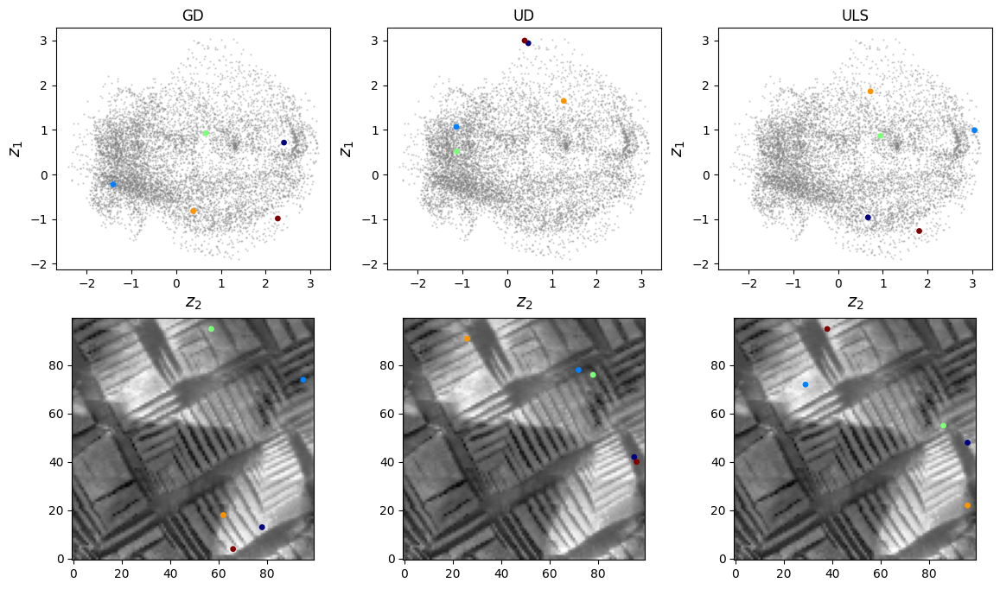

In [ ]:
#Seed points

kde_seed, uni_seed, uni_full_seed = sampling(z1, z2, z1z2_uni, z1_uni, z2_uni, 5)

fig, (ax1, ax2) = plt.subplots(2, 3, figsize = (14, 8))

for _ in ax1:
  _.set_aspect(aspect=1)
  _.scatter(z1, z2, s=0.5, c='grey', alpha=0.3)
  _.set_xlabel("$z_2$", fontsize=14)
  _.set_ylabel("$z_1$", fontsize=14)

ax1[0].set_title("GD")
ax1[0].scatter(z1[kde_seed], z2[kde_seed], s=15, c=np.arange(len(kde_seed)), cmap = 'jet')

ax1[1].set_title("UD")
ax1[1].scatter(z1[uni_seed], z2[uni_seed], s=15, c=np.arange(len(uni_seed)), cmap = 'jet')

ax1[2].set_title("ULS")
ax1[2].scatter(z1[uni_full_seed], z2[uni_full_seed], s = 15, c=np.arange(len(uni_full_seed)), cmap = 'jet')

for _ in ax2:
  _.imshow(pola, cmap='gray', origin = "lower",)

ax2[0].scatter(coords[kde_seed,1], coords[kde_seed,0], s=15, c=np.arange(len(kde_seed)), cmap = 'jet')

ax2[1].scatter(coords[uni_seed,1], coords[uni_seed,0], s=15, c=np.arange(len(uni_seed)), cmap = 'jet')

ax2[2].scatter(coords[uni_full_seed,1], coords[uni_full_seed,0], s = 15, c=np.arange(len(uni_full_seed)), cmap = 'jet')

#fig.savefig('figures/seed_points.jpg', dpi=300, bbox_inches='tight')

In [ ]:
#Priors

#select seeds and seed_names
seeds = [kde_seed, uni_seed, uni_full_seed]
seeds_name = ['GD', 'UD', 'ULS']

#select acquisition function to test
#list corresponds to Func sel_next_point.
acq_funcs = ['EI', 'MU', 'UCB']

#number of experimental exploration steps
exploration_steps = 50 #50

#number of epoches
num_cycles        = 200 #20 or 200
xi = 0.01  # balances exploration and exploitation for EI

In [ ]:
#the folder with the results named as rff variable will be created in the paternal directory

paternal = os.getcwd()

rff = "training/"
if not os.path.exists(rff):
  os.mkdir(rff)

# determine acqusition funciton,
acq = 3  # 0 uses EI, 1 explores max uncertainty point, 2 uses UCB

for i in range (len(seeds)):
  seed = seeds[i]

  os.chdir(paternal)

  rf = 'training/rf_train_seed_{}/'.format(seeds_name[i])   #root folder
  if not os.path.exists(rf):
    os.mkdir(rf)

  if acq == 3:             # when acq = 3, run all acq_funcs
    if not os.path.exists(rf + acq_funcs[0]):
      os.mkdir(rf + acq_funcs[0])
    if not os.path.exists(rf + acq_funcs[1]):
      os.mkdir(rf + acq_funcs[1])
    if not os.path.exists(rf + acq_funcs[2]):
      os.mkdir(rf + acq_funcs[2])
  elif acq < 3:
    if not os.path.exists(rf + acq_funcs[acq]):  # change root folder name when you change acquistion funciton
      os.mkdir(rf + acq_funcs[acq])

  save_explore =  "/explore_dkl_record/"

  if acq < 3:   # if user select an individual acquistion function
    acq_idx = acq
    dkl_explore(save_explore, num_cycles)

  elif acq == 3:  # if user selected to run all acquistion functions
    for i in range (3):
      acq_idx = i
      dkl_explore(save_explore, num_cycles)
      os.chdir(paternal)

5/5
Epoch 1/10 ... Training loss: 0.9197
Epoch 10/10 ... Training loss: 0.8811


#### Forensic analysis

Analysis of the data acquired in the Experiment section

In [65]:
os.chdir('/content/')
paternal = os.getcwd()

In [66]:
#import data
!gdown https://drive.google.com/file/d/1ta_uvdlWrlvRNJY1OJKqpV3xTKEgOwqW/view?usp=sharing --fuzzy

Downloading...
From: https://drive.google.com/uc?id=1ta_uvdlWrlvRNJY1OJKqpV3xTKEgOwqW
To: /content/Single_run.zip
100% 36.2M/36.2M [00:01<00:00, 28.6MB/s]


In [67]:
!unzip Single_run.zip

Archive:  Single_run.zip
   creating: Single_run/
  inflating: __MACOSX/._Single_run   
   creating: Single_run/rf_train_seed_GD/
  inflating: __MACOSX/Single_run/._rf_train_seed_GD  
  inflating: Single_run/.DS_Store    
  inflating: __MACOSX/Single_run/._.DS_Store  
   creating: Single_run/rf_train_seed_UD/
  inflating: __MACOSX/Single_run/._rf_train_seed_UD  
   creating: Single_run/rf_train_seed_ULS/
  inflating: __MACOSX/Single_run/._rf_train_seed_ULS  
  inflating: Single_run/rf_train_seed_GD/.DS_Store  
  inflating: __MACOSX/Single_run/rf_train_seed_GD/._.DS_Store  
   creating: Single_run/rf_train_seed_GD/MU/
  inflating: __MACOSX/Single_run/rf_train_seed_GD/._MU  
   creating: Single_run/rf_train_seed_GD/UCB/
  inflating: __MACOSX/Single_run/rf_train_seed_GD/._UCB  
   creating: Single_run/rf_train_seed_GD/EI/
  inflating: __MACOSX/Single_run/rf_train_seed_GD/._EI  
  inflating: Single_run/rf_train_seed_UD/.DS_Store  
  inflating: __MACOSX/Single_run/rf_train_seed_UD/._.DS_Sto

In [68]:
#number of exploration steps
exploration_steps = 50

#seed policies
seeds_name = ['GD', 'UD', 'ULS']

#acq functions
acq_funcs = ['EI', 'MU', 'UCB']

#base folder
base_folder = 'Single_run'

#paternal path
paternal = os.getcwd()

measured_points = dict()
var = dict()
traj = dict()
idx = dict()

var_im = dict()
mean_im = dict()
mse_im = dict()

In [71]:
os.chdir(paternal)

seeds = list()

for seed_idx in range(len(seeds_name)):
  rf = "/{}/rf_train_seed_{}/".format(base_folder, seeds_name[seed_idx])
  os.chdir(paternal+ rf)

  measured_points[seeds_name[seed_idx]] = dict() #y_test of the next exploring point
  var[seeds_name[seed_idx]] = dict() #(mean, sdt) for all step
  traj[seeds_name[seed_idx]] = dict()
  idx[seeds_name[seed_idx]] = dict()

  var_im[seeds_name[seed_idx]] = dict()
  mean_im[seeds_name[seed_idx]] = dict()
  mse_im[seeds_name[seed_idx]] = dict()



  for acq_idx in range (3):
    if acq_funcs[acq_idx] in os.listdir():
      mp_record_  = []
      var_record_ = []
      traj_record_ = []
      idx_record_ = []


      var_im_record = []
      mean_im_record = []
      mse_im_record = []

      for step in range (exploration_steps):
        record_ = np.load("{}/explore_dkl_record/record{}.npz".format(acq_funcs[acq_idx],step))
        var_record_.append([record_["var"].mean(), record_["var"].std()])
        mp_record_.append(record_["measured_point"].flatten())
        traj_record_.append(record_['next_point'])
        _comparison = np.all(coords == record_['next_point'], axis=1)
        idx_record_.append(np.where(_comparison)[0][0])

        var_im_record.append(record_["var"])#.reshape(pix, pix))
        mean_im_record.append(record_["mean"])
        mse_im_record.append(np.square(record_["mean"]-y_targ))

      measured_points[seeds_name[seed_idx]][acq_funcs[acq_idx]] = np.array(mp_record_).reshape(-1)
      var[seeds_name[seed_idx]][acq_funcs[acq_idx]] = np.array(var_record_)
      traj[seeds_name[seed_idx]][acq_funcs[acq_idx]] = np.array(traj_record_)
      idx[seeds_name[seed_idx]][acq_funcs[acq_idx]] = np.array(idx_record_)
      var_im[seeds_name[seed_idx]][acq_funcs[acq_idx]] = np.array(var_im_record)
      mean_im[seeds_name[seed_idx]][acq_funcs[acq_idx]] = np.array(mean_im_record)
      mse_im[seeds_name[seed_idx]][acq_funcs[acq_idx]] = np.array(mse_im_record)
  record_ = np.load("{}/explore_dkl_record/initial_traindata.npz".format(acq_funcs[0]))

  seeds.append(ind_by_coord(record_['indices_train'], coords))

os.chdir(paternal)

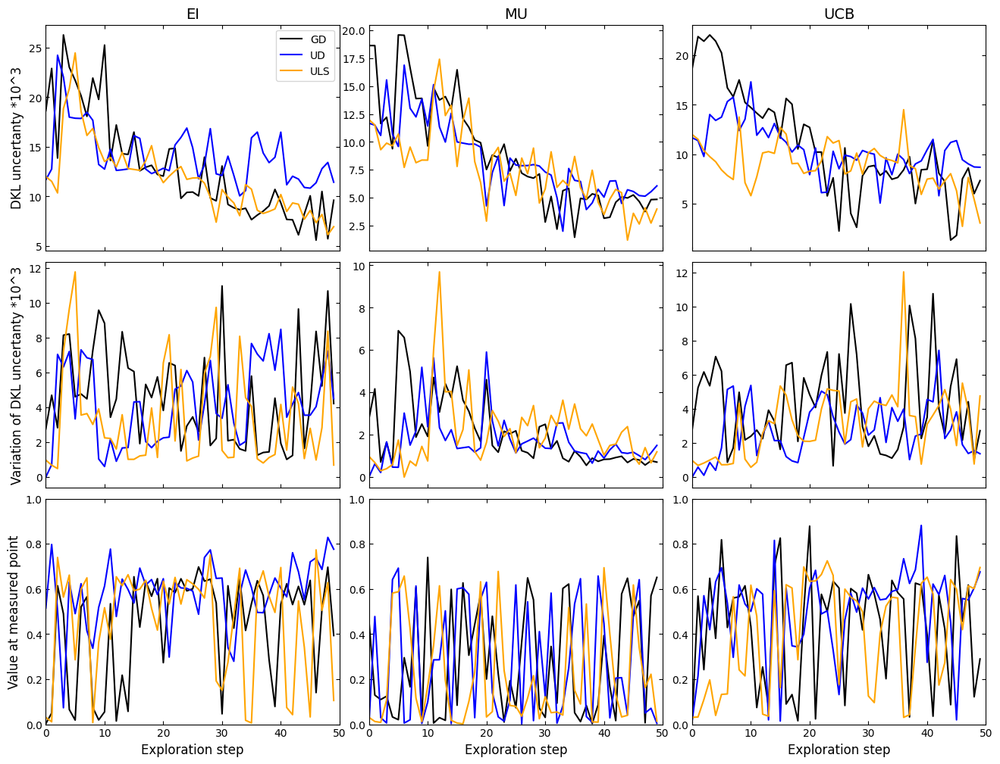

In [72]:
s = np.arange(exploration_steps) #step

fig, (ax0,ax1,ax2) = plt.subplots(3,3, figsize = (16, 12),
                              dpi = 100, sharex=True,)
fig.subplots_adjust(hspace=0.05, wspace=.1)

seeds_ = list(var.keys())
asc_   = list(var[seeds_[0]].keys())
colors = ['black', 'blue', 'orange']

ax0[0].set_ylabel('DKL uncertanty *10^3', fontsize=12)
ax1[0].set_ylabel('Variation of DKL uncertanty *10^3', fontsize=12)
ax2[0].set_ylabel('Value at measured point', fontsize=12)


for i, axx in enumerate(ax0):
  ax0[i].set_title(asc_[i], fontsize=14)
  ax2[i].set_xlabel('Exploration step', fontsize=12)
  axx.set_xlim(0,50)
  for k, sd in enumerate(seeds_):
    m_ = var[sd][asc_[i]][:,0]
    v_ = var[sd][asc_[i]][:,1]
    p_ = measured_points[sd][asc_[i]]

    ax0[i].plot(s, m_*1e3, c= colors[k], label = str(sd))
    ax1[i].plot(s, v_*1e3, c= colors[k], label = str(sd))
    ax2[i].plot(s, p_, c= colors[k], label = str(sd))


    ax0[i].tick_params('both', direction='in', top=True, right=True)
    ax1[i].tick_params('both', direction='in', top=True, right=True)
    ax2[i].tick_params('both', direction='in', top=True, right=True)

    ax2[i].set_ylim(0,1)
ax0[0].legend()

Text(0.5, 0, 'Exploration step')

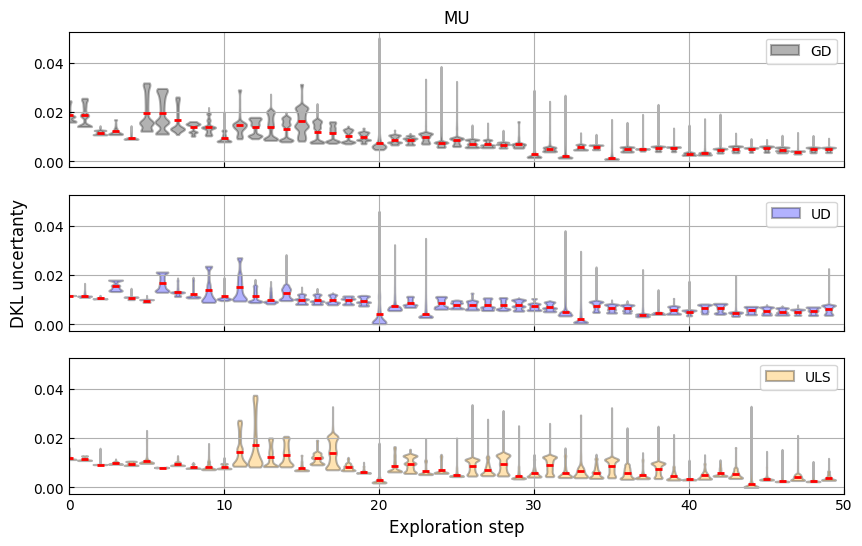

In [ ]:
#seed DKL violin

#select acquisition function
i=1 # 0-EI, 1-MU, 2-UCB

s = np.arange(exploration_steps) #step

fig, ax = plt.subplots(3,1, figsize = (10, 6),
                              dpi = 100, sharex=True,sharey=True)
fig.subplots_adjust(hspace=0.2, wspace=.1)

seeds_ = list(var.keys())
asc_   = list(var[seeds_[0]].keys())
colors = ['black', 'blue', 'orange']

for j in range(len(seeds_)):
  m_v_ = var_im[seeds_[j]][asc_[i]].T
  vp = ax[j].violinplot(m_v_, s, showextrema = False, showmeans=True, widths=0.9)
  vp['cmeans'].set_color('red')
  vp['cmeans'].set_linewidths(2)

  for pc in vp['bodies']:
    pc.set_facecolor(colors[j])
    pc.set_edgecolor('black')
    pc.set_linewidth(1.5)

  vp['bodies'][-1].set_label(seeds_[j])

  ax[j].set_xlim(0,50)
  ax[j].legend()
  ax[j].grid()
  ax[j].tick_params('both', direction='in')

ax[0].set_title(f'{asc_[i]}', fontsize=12)
ax[1].set_ylabel('DKL uncertanty' , fontsize=12)
ax[2].set_xlabel('Exploration step' , fontsize=12)


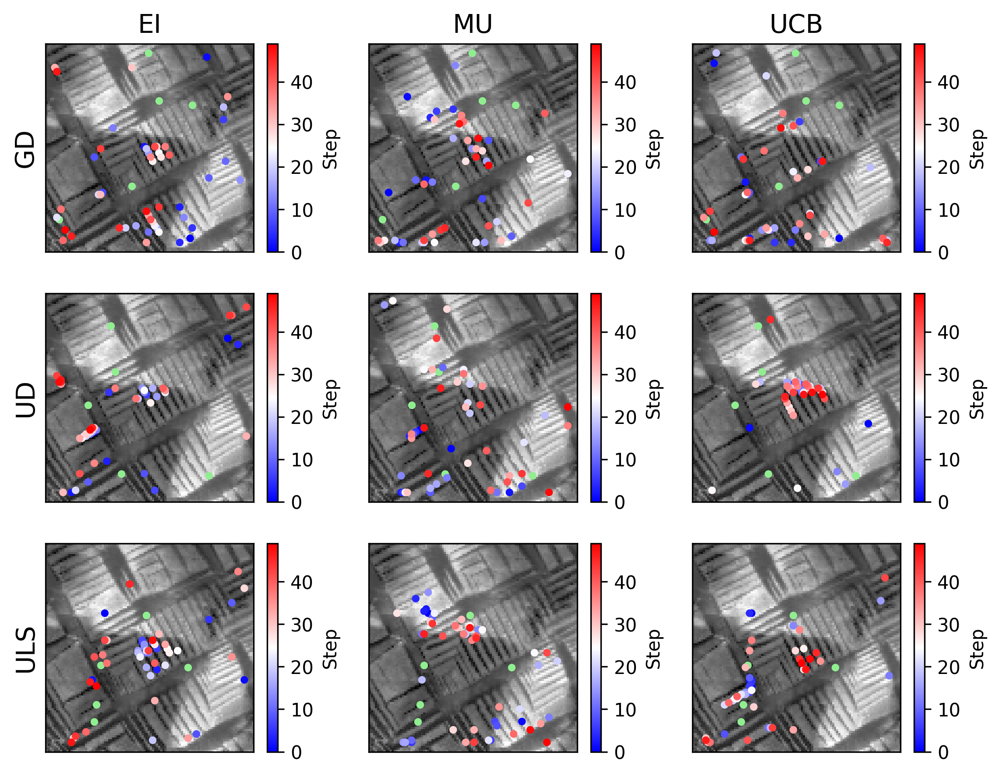

In [ ]:
#real trajectories
seeds_ = list(var_im.keys())
asc_   = list(var_im[seeds_[0]].keys())

shrink=1
fig, ax = plt.subplots(3, 3, figsize = (9, 7), dpi = 300)

for _ in ax.flat:
  _.imshow(pola, cmap='gray', origin = "lower",)
  _.set_xticks([])
  _.set_yticks([])

for j in range(len(seeds_)):
  for i in range(len(asc_)):
    ax[j,i].scatter(coords[seeds[j],1], coords[seeds[j],0], s=10,  color = 'lightgreen')
    kde_points = traj[seeds_[j]][asc_[i]].T #- ws/2
    ax[0,i].set_title(f'{asc_[i]}', fontsize=14)
    im1 = ax[j,i].scatter(kde_points[1], kde_points[0], s=10, c = np.arange(exploration_steps), cmap = 'bwr')
    fig.colorbar(im1, ax=ax[j,i], shrink = shrink, label = "Step")
  ax[j,0].set_ylabel(seeds_[j], fontsize=14)

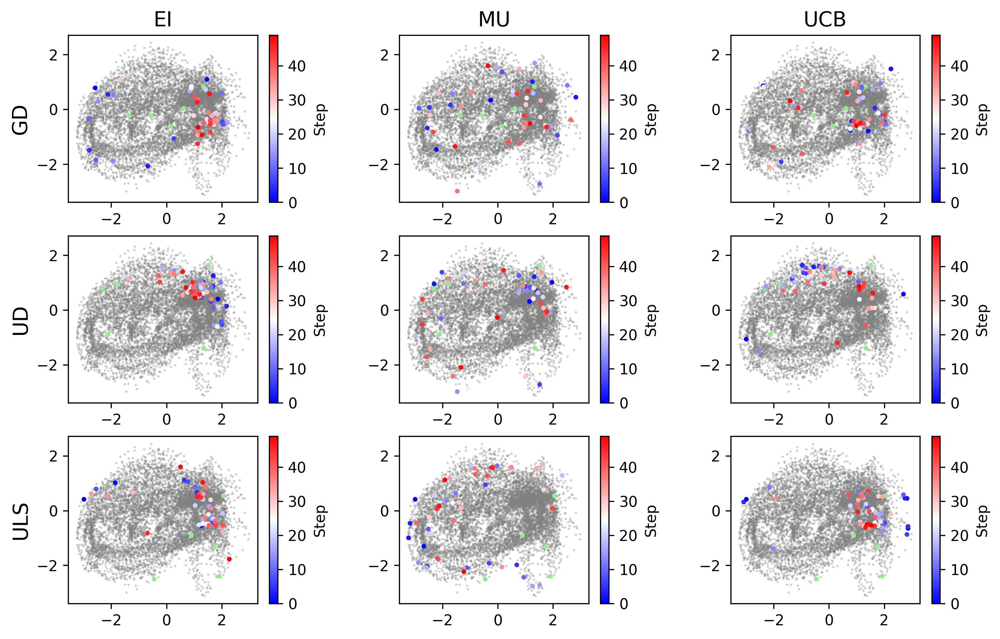

In [ ]:
#latent trajectories

seeds_ = list(var_im.keys())
asc_   = list(var_im[seeds_[0]].keys())

shrink=1
fig, ax = plt.subplots(3, 3, figsize = (11, 7), dpi = 300)
fig.subplots_adjust(wspace=0.4)

for _ in ax.flat:
  _.scatter(z1, z2, s=0.5, c='grey', alpha=0.3)

for j in range(len(seeds_)):
  for i in range(len(asc_)):
    ax[j,i].scatter(z1[seeds[j]], z2[seeds[j]], s=5,  color = 'lightgreen')
    z1_, z2_ = z1[idx[seeds_[j]][asc_[i]]], z2[idx[seeds_[j]][asc_[i]]]
    ax[0,i].set_title(f'{asc_[i]}', fontsize=14)
    im1 = ax[j,i].scatter(z1_, z2_, s=5, c = np.arange(exploration_steps), cmap = 'bwr')
    fig.colorbar(im1, ax=ax[j,i], shrink = shrink, label = "Step")
  ax[j,0].set_ylabel(seeds_[j], fontsize=14)

### DKL BO. Multiple runs.

Here, we conducted automated exploration multiple times for each acquisition function and seed policy, enabling us to gather statistical insights.

In [ ]:
#dkl functions for multiple runs
def dkl_explore2(X, y, coords, seed_idx, acq, exploration_steps = 50, path = '', num_cycles = 200,
                 xi = 0.01,):
  '''X:            image patches,
     y:            scalarizers,
     seed_idx:     indexes of seed points,
     coords:       list of coordinates corresponding to X,

  '''
  X_train = X[seed_idx,]
  X_test = np.delete(X, seed_idx, axis=0)
  y_train = y[seed_idx,]
  y_test = np.delete(y, seed_idx, axis=0)
  indices_train = coords[seed_idx,]
  indices_test = np.delete(coords, seed_idx, axis=0)
  print('X_train shape: '); print(X_train.shape)
  data_dim = X_train.shape[-1]

  if not os.path.exists(path):
    os.mkdir(path)
  os.chdir(path)
  np.savez("initial_traindata.npz", X_train = X_train, X_test = X_test, y_train = y_train,
           y_test = y_test, indices_train = indices_train, indices_test = indices_test)

  for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    # Update GP posterior
    dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
    dklgp.fit(X_train, y_train, training_cycles=num_cycles)
    mean, var = dklgp.predict(X, batch_size=len(X))
    # Compute acquisition function
    next_point_idx = sel_next_point2 (dklgp, X_train, X_test, xi, acq)
    next_point = indices_test[next_point_idx]
    # Do "measurement"
    measured_point = y_test[next_point_idx]
    # Update train and test datasets
    (X_train, X_test, y_train, y_test, indices_train,
     indices_test) = update_train_test_data(X_train, X_test, y_train, y_test,
                                            indices_train, indices_test,
                                            next_point_idx, measured_point, next_point)
    # Save result
    np.savez("record{}.npz".format(e),
             mean = mean, var = var, next_point_idx = next_point_idx,
             next_point = next_point, measured_point = measured_point)
  # Save final traindata
  np.savez("final_traindata.npz", X_train = X_train, X_test = X_test,
           y_train = y_train, y_test = y_test,
           indices_train = indices_train, indices_test = indices_test)


def sel_next_point2 (dklgp, X_train, X_test, xi, acq):
  '''
  Function selects next_point_idx based on either EI
  acquision function (0) or maximum uncertainty point (1)
  '''
  if acq == 'EI':  # 0 uses EI function
    best_f = torch.tensor(dklgp.predict(X_train)[0].max(), device=dklgp.device)
    obj = EI(dklgp, X_test, best_f, xi)
    next_point_idx = obj.mean(0).argmax()
  elif acq == 'MU':  # 1 explores the max uncertainty point
    mean0, var0 = dklgp.predict(X_test, batch_size=len(X_test))
    next_point_idx = var0.argmax()
  elif acq == 'UCB':  # 2 uses UCB function
    obj = UCB(dklgp, X_test)
    next_point_idx = obj.mean(0).argmax()

  return next_point_idx

#### Experiment

In [ ]:
#function for AE exploration
def multiple_train(acqs, seeds_names, seeds, dkl_dict, seeds_number = 3,
                   N=3, paternal_path = None):
  '''acqs:            acquision functions [EI, MU, UCB],
     seeds_names:           seed policies [kde, uniform_distr, uniform_ls],
     dkl_dict:        dict with dkl params {X, y}

  '''
  if paternal_path != None:
    os.chdir(paternal_path)
  else:
    paternal_path = os.getcwd()

  rff = "training/"
  if not os.path.exists(rff):
    os.mkdir(rff)

  # determine acqusition funciton,
  #asc 0 uses EI, 1 explores max uncertainty point, 2 uses UCB

  #from dkl dict
  X = dkl_dict['X']
  y = dkl_dict['y']
  coords = dkl_dict['coords']
  exploration_steps = dkl_dict['exp_steps']
  num_cycles = dkl_dict['cycles']
  xi = dkl_dict['xi']

  for seed_name in seeds_names:
    seed = seeds[seed_name]

    rf = 'training/mlt_train_seed_{}/'.format(seed_name)   #root folder
    if not os.path.exists(rf):
      os.mkdir(rf)

    for acq in acqs:
      rf2 = rf + acq
      if not os.path.exists(rf2):
        os.mkdir(rf2)
      for k, sd in enumerate(seed):
        rf3 = os.path.join(rf2, str(k))
        if not os.path.exists(rf3):
          os.mkdir(rf3)
        print(f'Acq: {acq}, Seed policy: {seed_name}, Seed set: {k}')
        dkl_explore2(X, y, coords, sd, path=rf3, num_cycles = num_cycles,
                     acq = acq, exploration_steps = exploration_steps)
        os.chdir(paternal_path)
        clear_output()

In [ ]:
#priors
dkl_dict = {'X':X,
            'y':y,
            'coords': coords,
            'exp_steps': 30,#30,
            'cycles': 200,#200,
            'xi': xi}

#number of the experiments for statistics
N=15

dict_seeds = create_subsamplings(z1, z2, z1z2_uni, z1_uni, z2_uni, size = 5, N=N)

In [ ]:
#experiment
multiple_train(acqs = ['EI','MU','UCB'], seeds_names = ['GD', 'UD', 'ULS'], seeds=dict_seeds, dkl_dict = dkl_dict,)

#### Forensic analysis

In [ ]:
os.chdir('/content/')

In [ ]:
#import data
!gdown https://drive.google.com/file/d/1z-Iy8nqAwJwSASiFoAoBx57DhxG3twcq/view?usp=sharing --fuzzy

Downloading...
From: https://drive.google.com/uc?id=1z-Iy8nqAwJwSASiFoAoBx57DhxG3twcq
To: /content/Multiple_runs.zip
100% 414M/414M [00:07<00:00, 54.1MB/s]


In [ ]:
!unzip Multiple_runs.zip

In [ ]:
#seed policies
seeds_name = ['GD', 'UD', 'ULS']

#acq functions
acq_funcs = ['EI', 'MU', 'UCB']

#base folder
base_folder = 'Multiple_runs'

#paternal path
paternal = os.getcwd()

# unfortunately, in the current version we do not save the prior
dkl_dict = {'X':X,
            'y':y,
            'coords': coords,
            'exp_steps': 30,
            'cycles': 200,
            'xi': xi}

measured_points = dict()
var = dict()
traj = dict()
idx = dict()
#ssim = {}

in_idx = {}
var_im = dict()
mean_im = dict()

In [ ]:
for sm in seeds_name:
  var[sm]             = {}
  measured_points[sm] = {}
  traj[sm]            = {}
  idx[sm]             = {}
  # ssim[sm]             = {}

  in_idx[sm]         = {}
  var_im[sm]          = {}
  mean_im[sm]          = {}
  for acq in acq_funcs:
    print(f'{sm} {acq} reading...')
    rf = '{}/mlt_train_seed_{}/{}/'.format(base_folder, sm, acq)
    var[sm][acq]             = []
    measured_points[sm][acq] = []
    traj[sm][acq]            = []
    idx[sm][acq]             = []
    # ssim[sm][acq]             = []
    in_idx[sm][acq]          = []
    var_im[sm][acq]          = []
    mean_im[sm][acq]          = []

    for folder in range(N):
      mp_record_   = []
      var_record_  = []
      traj_record_ = []
      idx_record_  = []
      # ssim_record_  = []
      var_im_record_ = []
      mean_im_record_ = []

      record_ = np.load("{}/{}/initial_traindata.npz".format(rf,folder))
      in_idx[sm][acq].append(ind_by_coord(record_['indices_train'], coords))

      for step in range (dkl_dict['exp_steps']):
        record_ = np.load("{}/{}/record{}.npz".format(rf,folder,step))
        var_record_.append([record_["var"].mean(), record_["var"].std()])
        mp_record_.append(record_["measured_point"].flatten())
        traj_record_.append(record_['next_point'])
        _comparison = np.all(coords == record_['next_point'], axis=1)
        idx_record_.append(np.where(_comparison)[0][0])
        # ssim_record_.append(structural_similarity(y.reshape(93,93),
        #                               record_["mean"].reshape(93,93),
        #                               data_range=1))
        var_im_record_.append(record_["var"])
        mean_im_record_.append(record_["mean"])

      var[sm][acq].append(var_record_)
      measured_points[sm][acq].append(mp_record_)
      traj[sm][acq].append(traj_record_)
      idx[sm][acq].append(idx_record_)
      # ssim[sm][acq].append(ssim_record_)
      var_im[sm][acq].append(var_im_record_)
      mean_im[sm][acq].append(mean_im_record_)

    var[sm][acq] = np.array(var[sm][acq])
    measured_points[sm][acq] = np.array(measured_points[sm][acq])
    traj[sm][acq] = np.array(traj[sm][acq])
    idx[sm][acq] = np.array(idx[sm][acq])
    # ssim[sm][acq] = np.array(ssim[sm][acq])
    var_im[sm][acq] = np.array(var_im[sm][acq])
    mean_im[sm][acq] = np.array(mean_im[sm][acq])

    in_idx[sm][acq] = np.array(in_idx[sm][acq])


os.chdir(paternal)

GD EI reading...
GD MU reading...
GD UCB reading...
UD EI reading...
UD MU reading...
UD UCB reading...
ULS EI reading...
ULS MU reading...
ULS UCB reading...


Seeds - GD, acquvision func - EI: 3
Seeds - GD, acquvision func - MU: 3
Seeds - GD, acquvision func - UCB: 4
Seeds - UD, acquvision func - EI: 2
Seeds - UD, acquvision func - MU: 1
Seeds - UD, acquvision func - UCB: 2
Seeds - ULS, acquvision func - EI: 3
Seeds - ULS, acquvision func - MU: 2
Seeds - ULS, acquvision func - UCB: 2


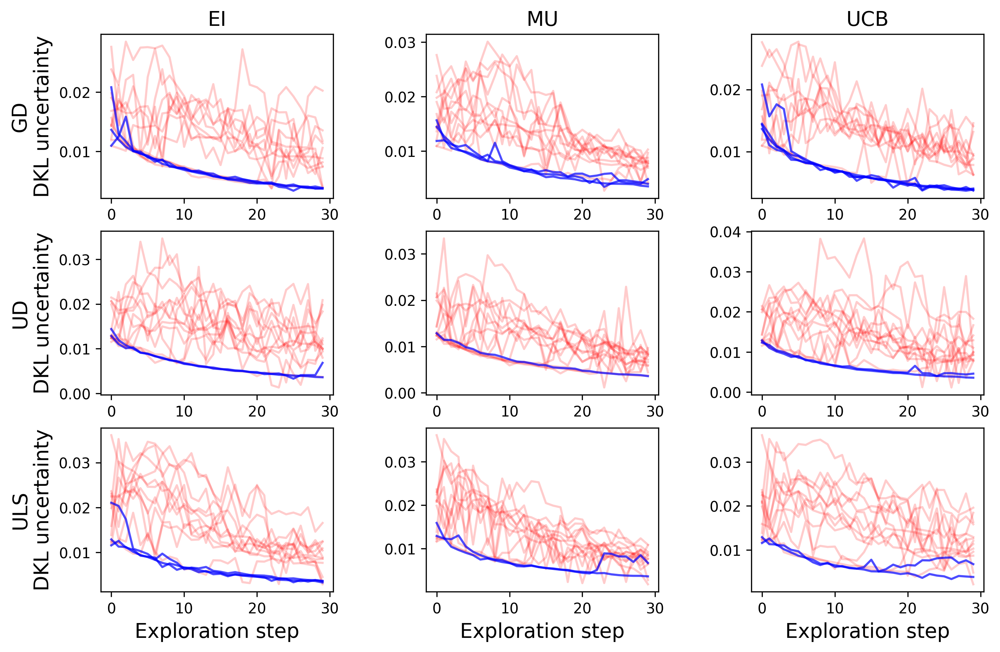

In [ ]:
#uncertancy curves
curve = 0 #0 - uncertainty, 1 - variation of uncertainty
var_thresh = 4e-6
mean_thresh = 8e-3

seeds_ = list(var.keys())
asc_   = list(var[seeds_[0]].keys())

idx_ref = dict()
idx_res = dict()

shrink=1
fig, ax = plt.subplots(3, 3, figsize = (11, 7), dpi = 300)
fig.subplots_adjust(wspace=0.4)


for j in range(len(seeds_)):
  idx_ref[seeds_[j]] = {}
  idx_res[seeds_[j]] = {}
  for i in range(len(asc_)):
    dat_ = var[seeds_[j]][asc_[i]]
    var_ = np.var(np.diff(dat_[:,:,0]),axis=1)
    mean_ = np.mean(dat_[:,:,0], axis=1)

    idx_refusal = np.where((var_ < var_thresh) & (abs(mean_) < mean_thresh))[0]
    idx_resid = np.setdiff1d(np.arange(len(dat_)),idx_refusal)
    idx_ref[seeds_[j]][asc_[i]] = idx_refusal
    idx_res[seeds_[j]][asc_[i]] = idx_resid
    print(f'Seeds - {seeds_[j]}, acquvision func - {asc_[i]}: {len(idx_refusal)}')

    ax[j,i].plot(dat_[idx_resid,:,curve].T, color='red', alpha=0.2)
    if len(idx_refusal) > 0:
      ax[j,i].plot(dat_[idx_refusal,:,curve].T, color='blue', alpha=0.7)
      pass
    ax[0,i].set_title(f'{asc_[i]}', fontsize=14)
    ax[j,0].set_ylabel(f'{seeds_[j]}\nDKL uncertainty', fontsize=14)
    ax[2,i].set_xlabel('Exploration step', fontsize=14)

Text(0, 0.5, 'Variation of average\nDKL uncertainty')

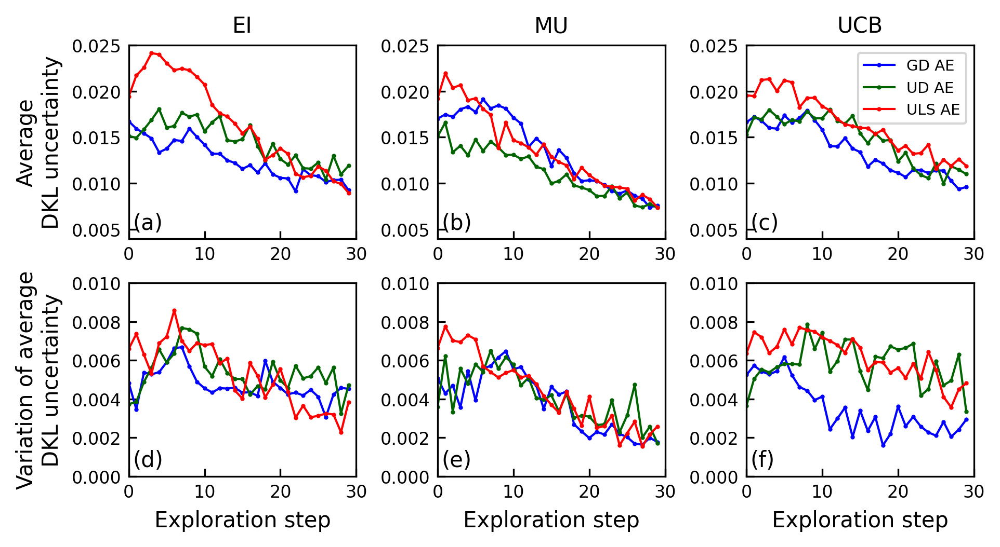

In [ ]:
#average uncertainty curves

colors = ['blue', 'darkgreen', 'red']

top_text = ['(a)', '(b)', '(c)']
bottom_text = ['(d)', '(e)', '(f)']

fig, ax = plt.subplots(2, 3, figsize = (6.3, 3.4), dpi = 300, constrained_layout=True)

for _ in ax.flat:
  _.tick_params('both', direction='in', labelsize=8)
  _.set_xlim(0,30)

for i in range(len(acq_funcs)):
  ax[0,i].set_title(acq_funcs[i], fontsize=10)
  ax[0,i].set_ylim(0.004,0.025)
  ax[1,i].set_ylim(0,0.01)
  ax[1,i].set_xlabel('Exploration step', fontsize=10)

  ax[0,i].text(0.5,0.005, s=top_text[i], fontsize=10)
  ax[1,i].text(0.5,0.0005, s=bottom_text[i], fontsize=10)

  for j in range(len(seeds_)):
    #____ AE exp_______
    dat_ = var[seeds_[j]][acq_funcs[i]]
    idx_resid = idx_res[seeds_[j]][acq_funcs[i]]
    mean_ = dat_[idx_resid,:,curve].mean(0)
    std_ =  dat_[idx_resid,:,curve].std(0)
    mse_ = np.mean(np.square(mean_im[seeds_[j]][acq_funcs[i]] - y_targ), axis=-1).mean(0)
    steps = np.arange(len(std_))

    ax[0,i].plot(steps, mean_, 'o-',color = colors[j], lw=1, ms=1, label=f'{seeds_[j]} AE')
    ax[1,i].plot(steps, std_, 'o-', color = colors[j], lw=1, ms=1)

ax[0,0].set_ylabel('Average\nDKL uncertainty', fontsize=10)
ax[0,2].legend(fontsize=7, loc=1)
ax[1,0].set_ylabel('Variation of average\nDKL uncertainty', fontsize=10)

### Seed policies driven exploration

In the AE simulation below we choose the next point at each not by BO, but follow the chosen policy (GD, UD, ULS).

#### Experiment

In [ ]:
paternal = os.getcwd()

#seed policies
seeds_n = ['GD', 'UD', 'ULS']

#number of simulations for statistical insight
exp_number = 10

#exploration range
start_size = 5
sampling_size = 40
sizes = np.arange(start_size, sampling_size+1)

In [ ]:
rf = "distribution_exp/"

if not os.path.exists(rf):
  os.mkdir(rf)


#seed points for each simulation
dict_subs_all = []
for _ in range(exp_number):
  dict_subs = {}
  dict_subs['GD'], dict_subs['UD'], dict_subs['ULS'] = sampling(z1, z2, z1z2_uni, z1_uni, z2_uni, seed_size = sampling_size)
  dict_subs_all.append(dict_subs)

#simulation
for n in range(exp_number):
  print('experiment {}'.format(n))
  os.chdir(os.path.join(paternal, rf))

  res = {}
  dict_subs = dict_subs_all[n]
  print(dict_subs)

  for seed in dict_subs.keys():
    res[seed] = []
    print(f'Distribution: {seed}')
    for s in sizes:
      print(f'Current size: {s}')
      samples = dict_subs[seed][:s]
      X_train_ = X[samples,]
      y_train_ = y_targ[samples,]
      data_dim = X_train_.shape[-1]
      dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
      dklgp.fit(X_train_, y_train_, training_cycles=200)
      mean_, var_ = dklgp.predict(X, batch_size=len(X))
      res[seed].append([mean_, var_])
    res[seed] = np.array(res[seed])
    print('-------------------')

  np.savez('record{}.npz'.format(n), GD = res['GD'], UD = res['UD'], ULS = res['ULS'])
  clear_output()

os.chdir(paternal)

#### Forensic analysis

In [ ]:
os.chdir('/content')

In [ ]:
#import data
!gdown https://drive.google.com/file/d/1NgwzqiJJ9f47SSup0R2VFWLz1TwSU3-z/view?usp=sharing --fuzzy

Downloading...
From: https://drive.google.com/uc?id=1NgwzqiJJ9f47SSup0R2VFWLz1TwSU3-z
To: /content/Sampling_model_exploration.zip
100% 152M/152M [00:02<00:00, 51.6MB/s]


In [ ]:
!unzip Sampling_model_exploration.zip

In [ ]:
paternal = os.getcwd()
#seed policies
seeds_n = ['GD', 'UD', 'ULS']

#number of simulations for statistical insight
exp_number = 20

#base folder
base_folder = 'Sampling_model_exploration'

#exploration range
start_size = 5
final_size = 50
sizes = np.arange(start_size, final_size+1)

In [ ]:
#averaging distribution experiment
distr_res = {'GD':[],'UD':[],'ULS':[]}
for i in range(exp_number):
  data = np.load(os.path.join(paternal, base_folder, f'record{i}.npz'))
  distr_res['GD'].append(data['GD'])
  distr_res['UD'].append(data['UD'])
  distr_res['ULS'].append(data['ULS'])

distr_res['GD'] = np.array(distr_res['GD'])
distr_res['UD'] = np.array(distr_res['UD'])
distr_res['ULS'] = np.array(distr_res['ULS'])

Text(0, 0.5, 'Average DKL uncertainty\nvariation')

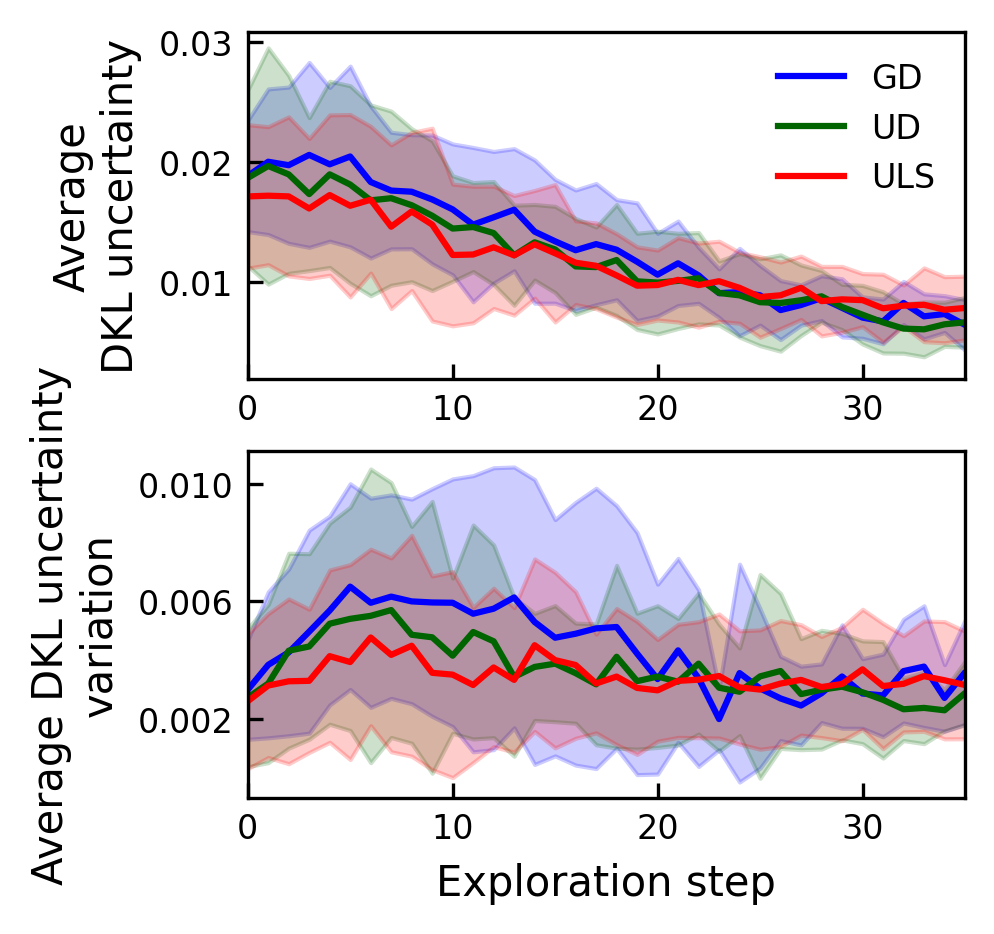

In [ ]:
colors = ['blue', 'darkgreen', 'red']

fig, ax = plt.subplots(2, 1, figsize=(3.2,3), dpi=300, constrained_layout=True)

for _ in ax.flat:
  _.set_xlim(0,35)
  _.tick_params('both', direction='in', labelsize=8)
  _.set_xticks(np.linspace(0,30,4))

for i,policy in enumerate(['GD', 'UD', 'ULS']):
  mean_ = distr_res[policy].mean(-1)[:,:,1].mean(0)
  std_ = distr_res[policy].mean(-1)[:,:,1].std(0)

  std_mean_ = distr_res[policy].std(-1)[:,:,1].mean(0)
  std_std_ = distr_res[policy].std(-1)[:,:,1].std(0)

  ax[0].plot(sizes - 5, mean_, label=policy, color = colors[i])
  ax[0].fill_between(sizes -5 , mean_ - std_, mean_ + std_, alpha=0.2, color = colors[i])

  ax[1].plot(sizes - 5, std_mean_, color = colors[i])
  ax[1].fill_between(sizes - 5, std_mean_ - std_std_, std_mean_ + std_std_, alpha=0.2, color = colors[i])

ax[0].legend(fontsize=8, frameon=False)
ax[1].set_yticks([0.002, 0.006, 0.01])
ax[1].set_xlabel('Exploration step', fontsize=10)

ax[0].set_ylabel('Average\nDKL uncertainty', fontsize=10)
ax[1].set_ylabel('Average DKL uncertainty\nvariation', fontsize=10)

## 7. In-Loop interventions

#### Seed intervention policies

In [25]:
#exclusion KDE sampling
def kde_samples(train_ind, policy='GD', dist_thresh = 0.2, dist_exc_thresh = 0.5):
  global z1, z2, z1z2_grid, z1z2, z1z2_uni2

  z1z2_fin = np.c_[z1[train_ind], z2[train_ind]]

  # region with latent distribution
  tree = KDTree(z1z2.T)
  _dist, _ind = tree.query(z1z2_grid.T, k=1)

  # explored region
  tree1 = KDTree(z1z2_fin)
  if policy =='UD':
    _dist1, _ind1 = tree1.query(z1z2_grid.T, k=1)
    z1z2_res= z1z2_grid.T[(_dist<dist_thresh)&(_dist1>dist_exc_thresh)].T
  elif policy =='ULS':
    _dist1, _ind1 = tree1.query(z1z2_uni2.T, k=1)
    z1z2_res= z1z2_uni2.T[(_dist1>dist_exc_thresh)].T
  elif policy == 'GD':
    _dist1, _ind1 = tree1.query(z1z2.T, k=1)
    z1z2_res= z1z2.T[_dist1>dist_exc_thresh].T
  return z1z2_res

Load our pre-existing dataset to illustrate 'regional exclusion' and 'regional prioritization' policies. This is the same dataset as in **DKL BO. Multiple runs.**

In [26]:
os.chdir('/content')

In [27]:
!gdown https://drive.google.com/file/d/1z-Iy8nqAwJwSASiFoAoBx57DhxG3twcq/view?usp=sharing --fuzzy

Downloading...
From: https://drive.google.com/uc?id=1z-Iy8nqAwJwSASiFoAoBx57DhxG3twcq
To: /content/Multiple_runs.zip
100% 414M/414M [00:06<00:00, 62.5MB/s]


In [ ]:
!unzip Multiple_runs.zip

**Regional exclusion**

In [ ]:
#load one experimental curve

base_folder = 'Multiple_runs'

#select sampling model
sm   = 'GD'
#select acquisition function
acq    = 'UCB'
#select number of simulation
n_exp = 0

rf = '{}/mlt_train_seed_{}/{}/{}'.format(base_folder, sm, acq, n_exp)

record_ = np.load(f'{rf}/final_traindata.npz')

In [ ]:
#the most recent 15 explored locations (microstructures)
final_train = ind_by_coord(record_['indices_train'], coords)[-15:]
z1z2_fin = np.c_[z1[final_train], z2[final_train]]

#all possible positions
final_test = ind_by_coord(record_['indices_test'], coords)

In [ ]:
dist_thresh = 0.2

#distance from measured points to exclude
dist_exc_thresh = 0.5

In [ ]:
z1z2_GD = kde_samples(final_train, dist_thresh = 0.2, dist_exc_thresh = 0.5)
z1z2_UD = kde_samples(final_train, dist_thresh = 0.2,
                      policy='UD', dist_exc_thresh = 0.5)

z1z2_ULS = kde_samples(final_train, dist_thresh = 0.2,
                       policy='ULS', dist_exc_thresh = 0.5)

In [ ]:
res_kde = KernelDensity(kernel='gaussian', bandwidth='scott').fit(z1z2_GD.T)
res_gaus = np.reshape(np.exp(res_kde.score_samples(z1z2_grid.T)), z_x.shape)

res_kde = KernelDensity(kernel='tophat', bandwidth='scott').fit(z1z2_UD.T)
res_uni = np.reshape(np.exp(res_kde.score_samples(z1z2_grid.T)), z_x.shape)

res_kde = KernelDensity(kernel='tophat', bandwidth='scott').fit(z1z2_ULS.T)
res_uls = np.reshape(np.exp(res_kde.score_samples(z1z2_grid.T)), z_x.shape)

**Regional prioritising**

In [ ]:
# locations  with the highest and the lowest scalarizer values

max_ind = np.where(y > .85)[0][11]
min_ind = np.where(y < 0.002)[0][-17]

In [ ]:
dthresh = 0.1
reg_max_ind = np.where(np.linalg.norm(np.vstack([z1,z2]).T - [z1[max_ind],z2[max_ind]], axis=1) < dthresh)[0]
reg_min_ind = np.where(np.linalg.norm(np.vstack([z1,z2]).T - [z1[min_ind],z2[min_ind]], axis=1) < dthresh)[0]

In [ ]:
res_kde = KernelDensity(kernel='gaussian', bandwidth=0.15).fit(np.vstack([z1,z2]).T[reg_max_ind])
res_gaus_max = np.reshape(np.exp(res_kde.score_samples(z1z2_grid.T)), z_x.shape)

res_kde = KernelDensity(kernel='gaussian', bandwidth=0.15).fit(np.vstack([z1,z2]).T[reg_min_ind])
res_gaus_min = np.reshape(np.exp(res_kde.score_samples(z1z2_grid.T)), z_x.shape)

Text(0.5, 1.0, 'Regional prioritizing')

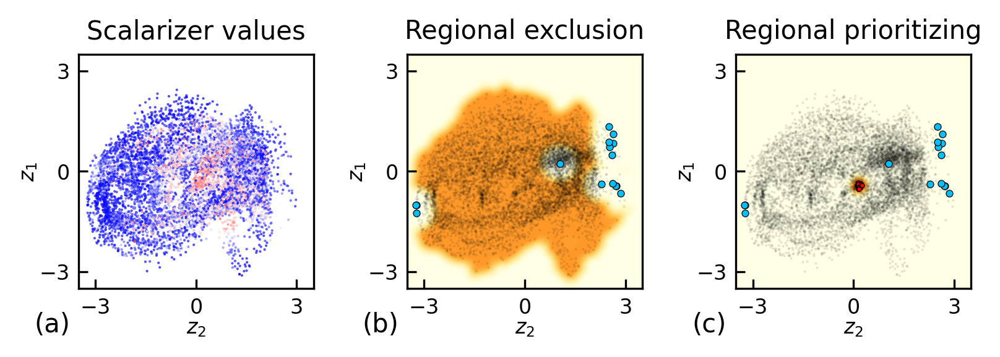

In [ ]:
#figure KDE for intervetions
letter = ['(a)', '(b)', '(c)']

fig, ax = plt.subplots(1, 3, figsize = (6.2, 6.2), dpi=300)#, constrained_layout=True)
fig.subplots_adjust(wspace=0.4)


for i, _ in enumerate(ax.flat):
  _.set_aspect('equal')
  _.set_xlabel("$z_2$", fontsize=8, labelpad=0.1)
  _.set_ylabel("$z_1$", fontsize=8, labelpad=0.1)
  _.set_xlim(-3.5,3.5)
  _.set_ylim(-3.5,3.5)
  _.set_xticks([-3,0,3])
  _.set_yticks([-3,0,3])
  _.tick_params('both', direction='in', labelsize=8)
  _.text(-4.3, -4.8, s=letter[i], wrap=True, ha='center')

ax[0].scatter(z1, z2, c=y, s=1, linewidths=0, alpha=0.7, cmap='bwr')

for _ in ax[1:]:
  _.scatter(z1, z2, c='black', s=1, linewidths=0, alpha=0.1)
  _.scatter(z1z2_fin[:,0], z1z2_fin[:,1], color='deepskyblue', s=7, linewidths=0.3, edgecolor='black')

ax[0].set_title('Scalarizer values', fontsize=10)

ax[1].imshow(np.rot90(res_uni), cmap='YlOrBr', vmax=res_uni.max()*2,
              extent=[z1min-ext, z1max+ext, z2min-ext, z2max+ext])
ax[1].set_title('Regional exclusion', fontsize=10)

ax[2].imshow(np.rot90(res_gaus_max), cmap='YlOrBr',
              extent=[z1min-ext, z1max+ext, z2min-ext, z2max+ext])
ax[2].scatter(z1[_inds], z2[_inds], color='red', s=3, linewidths=0.3, edgecolor='black')
ax[2].set_title('Regional prioritizing', fontsize=10)

#### Experiment

In [ ]:
#functions
def intervention_points(z1, z2, sd, int_policy=None, int_length=5, inds=None):
  print('_____ Intervention ______')
  if int_policy == 'GD':
    z1z2_res = kde_samples(sd, policy='GD',
                           dist_exc_thresh = 0.5)
    _, _ind = kde (z1z2_res[0], z1z2_res[1], z1, z2, int_length,
                                              kde_kernel='gaussian')
  elif int_policy == 'UD':
    z1z2_res = kde_samples(sd, policy='UD',
                           dist_exc_thresh = 0.5)
    _, _ind = kde (z1z2_res[0], z1z2_res[1], z1, z2, int_length,
                   kde_kernel='tophat')
  elif (int_policy == 'prioritizing') and (inds.all() != None):
    _, _ind = kde (z1[inds], z2[inds], z1, z2, int_length,
                   kde_kernel='gaussian', bandwidth=0.1)
  else:
    raise ValueError('The intervention policy does not support')

  return _ind

def dkl_explore3(X, y, coords, seed_idx, acq, exploration_steps = 50, pref = '', num_cycles = 200,
                 xi = 0.01):
  '''X:            image patches,
     y:            scalarizers,
     seed_idx:     indexes of seed points,
     coords:       list of coordinates corresponding to X,

  '''
  X_train = X[seed_idx,]
  X_test = np.delete(X, seed_idx, axis=0)
  y_train = y[seed_idx,]
  y_test = np.delete(y, seed_idx, axis=0)
  indices_train = coords[seed_idx,]
  indices_test = np.delete(coords, seed_idx, axis=0)

  print('X_train shape: '); print(X_train.shape)
  data_dim = X_train.shape[-1]

  # if not os.path.exists(path):
  #   os.mkdir(path)
  # os.chdir(path)

  np.savez("{}initial_traindata.npz".format(pref), X_train = X_train, X_test = X_test, y_train = y_train,
           y_test = y_test, indices_train = indices_train, indices_test = indices_test)

  for e in range(exploration_steps):
    print("{}/{}".format(e+1, exploration_steps))
    # Update GP posterior
    dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
    dklgp.fit(X_train, y_train, training_cycles=num_cycles)
    mean, var = dklgp.predict(X, batch_size=len(X))
    # Compute acquisition function
    next_point_idx = sel_next_point2 (dklgp, X_train, X_test, xi, acq)
    next_point = indices_test[next_point_idx]
    # Do "measurement"
    measured_point = y_test[next_point_idx]
    (X_train, X_test, y_train, y_test, indices_train, indices_test) = update_train_test_data(X_train,
                                                                                             X_test,
                                                                                             y_train,
                                                                                             y_test,
                                                                                             indices_train,
                                                                                             indices_test,
                                                                                             next_point_idx,
                                                                                             measured_point,
                                                                                             next_point)
    np.savez("{}record{}.npz".format(pref, e),
             mean = mean, var = var, next_point_idx = next_point_idx,
             next_point = next_point, measured_point = measured_point)
  # Save final traindata
  np.savez("{}final_traindata.npz".format(pref), X_train = X_train, X_test = X_test,
           y_train = y_train, y_test = y_test,
           indices_train = indices_train, indices_test = indices_test)
  return X_train, X_test, y_train, y_test, indices_train, indices_test



def multiple_train_inteventions(acqs, seeds_names, seeds, dkl_dict, seeds_number = 3,
                   N=3, paternal_path = None, interventions = None):
  global z1, z2
  '''
  acqs:            acquision functions [EI, MU, UCB],
  seeds_names:           seed policies [kde, uniform_distr, uniform_ls],
  dkl_dict:        dict with dkl params {X, y}

  '''
  if paternal_path != None:
    os.chdir(paternal_path)
  else:
    paternal_path = os.getcwd()

  rff = "training/"
  if not os.path.exists(rff):
    os.mkdir(rff)

  #from dkl dict
  X = dkl_dict['X']
  y = dkl_dict['y']
  coords = dkl_dict['coords']
  exploration_steps = dkl_dict['exp_steps']
  num_cycles = dkl_dict['cycles']
  xi = dkl_dict['xi']


  int_step = interventions['steps']
  int_length = interventions['length']
  int_policy = interventions['policy']
  if int_policy == 'prioritizing':
    inds = interventions['indexes']
  else:
    inds = None

  for seed_name in seeds_names:
    seed = seeds[seed_name]

    rf = 'training/mlt_train_seed_interv_{}/'.format(seed_name)   #root folder
    if not os.path.exists(rf):
      os.mkdir(rf)

    for acq in acqs:
      rf2 = rf + acq
      if not os.path.exists(rf2):
        os.mkdir(rf2)
      for k, sd in enumerate(seed):
        rf3 = os.path.join(rf2, str(k))
        if not os.path.exists(rf3):
          os.mkdir(rf3)
        print(f'Acq: {acq}, Seed policy: {seed_name}, Seed set: {k}')

        os.chdir(rf3)

        #dkl explore
        X_train, X_test, y_train, y_test, indices_train, indices_test = dkl_explore3(X, y,
                                                                                      coords,
                                                                                      seed_idx=sd, pref = '0_',
                                                                                      num_cycles = num_cycles,
                                                                                      acq = acq,
                                                                                      exploration_steps = int_step)
        sd = ind_by_coord(indices_train, coords)

        #intervention
        _ind = intervention_points(z1, z2, sd, int_policy=int_policy, int_length=int_length, inds=inds)
        print(_ind)
        for _i_st,_i in enumerate(_ind.astype(int)):
          print(_i)
          data_dim = X_train.shape[-1]
          dklgp = aoi.models.dklGPR(data_dim, embedim=2, precision="single")
          dklgp.fit(X_train, y_train, training_cycles=num_cycles)
          mean, var = dklgp.predict(X_test, batch_size=len(X_test))
          next_point_idx = np.where(ind_by_coord(indices_test, coords) == _i)[0][0]
          next_point = indices_test[next_point_idx]
          measured_point = y_test[next_point_idx]

          (X_train, X_test, y_train, y_test, indices_train,
           indices_test) = update_train_test_data(X_train, X_test, y_train, y_test,
                                                  indices_train, indices_test,
                                                  next_point_idx, measured_point, next_point)

          sd = ind_by_coord(indices_train, coords)
          np.savez("int_record_{}.npz".format(_i_st),
                   mean = mean, var = var, next_point_idx = next_point_idx,
                   next_point = next_point, measured_point = measured_point)

        #dkl_explore2
        X_train, X_test, y_train, y_test, indices_train, indices_test = dkl_explore3(X, y,
                                                                                      coords,
                                                                                      seed_idx=sd, pref = '1_',
                                                                                      num_cycles = num_cycles,
                                                                                      acq = acq,
                                                                                      exploration_steps = exploration_steps - int_step)

        #dkl_without_intervention
        indices_train = np.load("0_final_traindata.npz")['indices_train']
        sd = ind_by_coord(indices_train, coords)

        X_train, X_test, y_train, y_test, indices_train, indices_test = dkl_explore3(X, y,
                                                                                     coords,
                                                                                     seed_idx=sd, pref = '1a_',
                                                                                     num_cycles = num_cycles,
                                                                                     acq = acq,
                                                                                     exploration_steps = exploration_steps - int_step+int_len)



        os.chdir(paternal_path)
        clear_output()


In [ ]:
#priors
dkl_dict = {'X':X,
            'y':y,
            'coords': coords,
            'exp_steps': 40,
            'cycles': 200,
            'xi': 0.01}

'''
We interrupt the exploration after the initial 20 steps, introducing
a regional prioritizing intervention lasting for 5 steps.
'''
int_dict = {'steps':  20,
            'length': 5,
            'policy': 'prioritizing',
            'indexes': reg_min_ind}

In [ ]:
#title processing
patern_path = '/content'


N=15

dict_seeds = create_subsamplings(z1, z2, z1z2_uni, z1_uni, z2_uni, size = 5, N=N)


multiple_train_inteventions(acqs = ['MU'],
                            seeds_names = ['GD'],
                            seeds=dict_seeds,
                            dkl_dict = dkl_dict,
                            interventions=int_dict,
                            paternal_path=patern_path)


params_dict = {'dkl': dkl_dict, 'interventions':int_dict, 'N':N}

#save experiment priors!
with open(os.path.join(patern_path, 'training','params.pkl'), 'wb') as file:
  pickle.dump(params_dict, file)

#### Forensic analysis

In [43]:
#extract data function

def extract_curves(patern_path, base_folder, branch):
  '''
    branch(boolean): True - branch with intervention, False - branch without intervention
  '''

  inter = branch #evolution with/without interaction

  training_folder = base_folder#'training'

  os.chdir(patern_path)

  measured_points = {}
  var    = {}
  traj   = {}
  idx    = {}
  in_idx = {}
  var_im = {}

  #load params
  with open(os.path.join(patern_path, training_folder,'params.pkl'), 'rb') as file:
    _pdict = pickle.load(file)

  for seed_n in seeds_name:

    int_step = _pdict['interventions']['steps']
    int_len  = _pdict['interventions']['length']
    exploration_steps = _pdict['dkl']['exp_steps']

    rf = "{}/mlt_train_seed_interv_{}/".format(training_folder, seed_n)
    if os.path.exists(rf):
      var[seed_n]             = {}
      measured_points[seed_n] = {}
      traj[seed_n]            = {}
      idx[seed_n]             = {}
      in_idx[seed_n]          = {}
      var_im[seed_n]          = {}

      os.chdir(patern_path + rf)
      for _acq in acq_funcs:
        if _acq in os.listdir():
          print(_acq)
          rff = os.path.join(patern_path,rf,_acq)

          var[seed_n][_acq]             = []
          measured_points[seed_n][_acq] = []
          traj[seed_n][_acq]            = []
          idx[seed_n][_acq]             = []
          in_idx[seed_n][_acq]          = []
          var_im[seed_n][_acq]          = []


          #sweep through the exp folders
          for n in range(_pdict['N']):
            mp_record_   = []
            var_record_  = []
            traj_record_ = []
            idx_record_  = []
            var_im_record_ = []

            fold_traj = []
            #sweep 1st part
            for i in range(int_step):
              fold_traj.append("{}/{}/0_record{}.npz".format(rff, n, i))
            if inter:
              for i in range(int_len):
                fold_traj.append("{}/{}/int_record_{}.npz".format(rff, n, i))
              for i in range(exploration_steps - int_step):
                fold_traj.append("{}/{}/1_record{}.npz".format(rff, n, i))
            else:
              for i in range(exploration_steps - int_step + int_len):
                fold_traj.append("{}/{}/1a_record{}.npz".format(rff, n, i))

            for path in fold_traj:
              record_ = np.load(path)
              var_record_.append([record_["var"].mean(), record_["var"].std()])
              mp_record_.append(record_["measured_point"].flatten())
              traj_record_.append(record_['next_point'])
              _comparison = np.all(coords == record_['next_point'], axis=1)
              idx_record_.append(np.where(_comparison)[0][0])
              var_im_record_.append(record_["var"])

            var[seed_n][_acq].append(var_record_)
            measured_points[seed_n][_acq].append(mp_record_)
            traj[seed_n][_acq].append(traj_record_)
            idx[seed_n][_acq].append(idx_record_)
            var_im[seed_n][_acq].append(var_im_record_)

          var[seed_n][_acq] = np.array(var[seed_n][_acq])
          measured_points[seed_n][_acq] = np.array(measured_points[seed_n][_acq])
          traj[seed_n][_acq] = np.array(traj[seed_n][_acq])
          idx[seed_n][_acq] = np.array(idx[seed_n][_acq])
          var_im[seed_n][_acq] = np.array(var_im[seed_n][_acq])

  return var, measured_points, traj, idx, var_im, (exploration_steps, int_len, int_step)

In [30]:
os.chdir('/content')

In [31]:
!gdown https://drive.google.com/file/d/1Czov7w7VSnOQaDeh2TvfDMMIGFNj7nx2/view?usp=sharing --fuzzy

Downloading...
From: https://drive.google.com/uc?id=1Czov7w7VSnOQaDeh2TvfDMMIGFNj7nx2
To: /content/Seed_intervention.zip
100% 754M/754M [00:11<00:00, 67.4MB/s]


In [ ]:
!unzip Seed_intervention.zip

In [44]:
os.chdir('/content')
paternal = '/content/Seed_intervention/'

seeds_name = ['GD', 'UD', 'ULS']
acq_funcs = ['EI', 'MU', 'UCB']

base_folder = 'prioritizing_bad'
v_pr_b_false, _, traj_pr_b_false, idx_pr_b_false, vi_pr_b_false, params = extract_curves(paternal, base_folder, branch=False)
v_pr_b_true, _, traj_pr_b_true, idx_pr_b_true, vi_pr_b_true, _ = extract_curves(paternal, base_folder, branch=True)

base_folder = 'prioritizing_g'
v_pr_g_false, _, traj_pr_g_false, idx_pr_g_false, vi_pr_g_false, _ = extract_curves(paternal, base_folder, branch=False)
v_pr_g_true, _, traj_pr_g_true, idx_pr_g_true, vi_pr_g_true, _ = extract_curves(paternal, base_folder, branch=True)

base_folder = 'exclusion'
v_ex_false, _, traj_ex_false, idx_ex_false, vi_ex_false, _ = extract_curves(paternal, base_folder, branch=False)
v_ex_true, _, traj_ex_true, idx_ex_true, vi_ex_true, _ = extract_curves(paternal, base_folder, branch=True)

EI
MU
EI


<ipython-input-43-02645f1f9356>:94: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  var_im[seed_n][_acq] = np.array(var_im[seed_n][_acq])


MU
EI
MU
EI
MU
EI
MU
EI
MU


In [38]:
list_curves = [v_ex_false['GD']['EI'][:,:,0],  v_ex_true['GD']['EI'][:,:,0], v_ex_false['GD']['MU'][:,:,0], v_ex_true['GD']['MU'][:,:,0],
               v_pr_g_false['GD']['EI'][:,:,0], v_pr_g_true['GD']['EI'][:,:,0], v_pr_g_false['GD']['MU'][:,:,0], v_pr_g_true['GD']['MU'][:,:,0],
               v_pr_b_false['GD']['EI'][:,:,0], v_pr_b_true['GD']['EI'][:,:,0], v_pr_b_false['GD']['MU'][:,:,0], v_pr_b_true['GD']['MU'][:,:,0]]

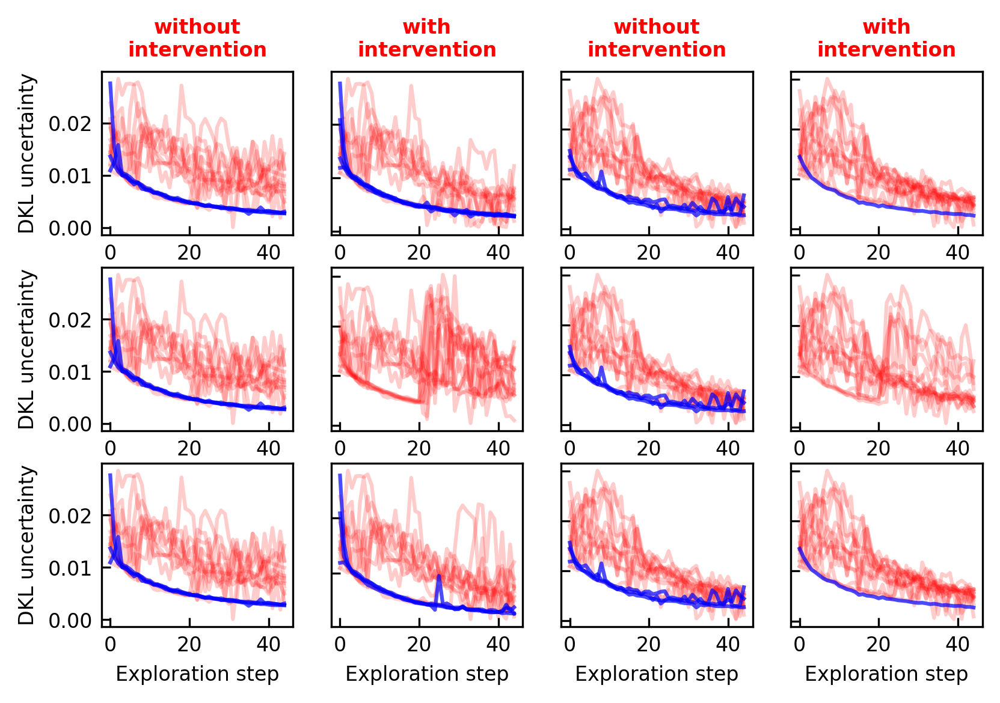

In [39]:
curve = 0 #0 - uncertainty, 1 - variation of uncertainty
var_thresh = 5e-6
mean_thresh = 5e-3#3.5e-3

fig, ax = plt.subplots(3, 4, figsize = (6.3, 4), dpi = 300)

subtitles_row = ['without\nintervention', 'with\nintervention', 'without\nintervention', 'with\nintervention']

for i,_ in enumerate(ax.flat):
  _.tick_params('both', direction='in', labelsize=8)
  if i%4 != 0:
    _.set_yticklabels([])
  #_.set_yticklabels([])

  dat_ = list_curves[i]
  var_ = np.var(np.diff(dat_[:,25:45]),axis=1)
  mean_ = np.mean(dat_[:,25:45],axis=1)

  idx_refusal = np.where((var_ < var_thresh) & (abs(mean_) < mean_thresh))[0]
  idx_resid = np.setdiff1d(np.arange(len(dat_)),idx_refusal)

  _.plot(dat_[idx_resid].T, color='red', alpha=0.2)
  if len(idx_refusal) > 0:
    _.plot(dat_[idx_refusal].T, color='blue', alpha=0.7)



for axx in ax:
  axx[0].set_ylabel('DKL uncertainty', fontsize=8)

for axx in ax[-1]:
  axx.set_xlabel('Exploration step', fontsize=8)

for i, axx in enumerate(ax[0]):
  axx.set_title(subtitles_row[i], fontsize=8, color='red', fontweight='bold')

Curves for violin plots.

In [40]:
m_v_without = [vi_ex_false['GD']['MU'][4].T,
               vi_pr_g_false['GD']['EI'][2].T,
               vi_pr_b_false['GD']['EI'][6].T,]

m_v_after = [vi_ex_true['GD']['MU'][4].T[25:],
             vi_pr_g_true['GD']['EI'][2].T[25:],
             vi_pr_b_true['GD']['EI'][6].T[25:]]

m_v_inter = [vi_ex_true['GD']['MU'][4].T[20:25],
             vi_pr_g_true['GD']['EI'][2].T[20:25],
             vi_pr_b_true['GD']['EI'][6].T[20:25]]

traj_without = [traj_ex_false['GD']['MU'][4].T,
                traj_pr_g_false['GD']['EI'][2].T,
                traj_pr_b_false['GD']['EI'][6].T,]

traj_with = [traj_ex_true['GD']['MU'][4].T,
             traj_pr_g_true['GD']['EI'][2].T,
             traj_pr_b_true['GD']['EI'][6].T,]

trajj = [traj_with, traj_without]

idx_without = [idx_ex_false['GD']['MU'][4].T,
                idx_pr_g_false['GD']['EI'][2].T,
                idx_pr_b_false['GD']['EI'][6].T,]

idx_with = [idx_ex_true['GD']['MU'][4].T,
             idx_pr_g_true['GD']['EI'][2].T,
             idx_pr_b_true['GD']['EI'][6].T,]

idxx = [idx_with, idx_without]

In [41]:
def violine_param(vp, range = None,
                  facecolor='black',
                  edgecolor = 'gray',
                  linewidth = 1.5,
                  label = '',
                  means = {'color':     'red',
                           'linewidth': 2}):

  if range is not None:
    vpp = vp['bodies'][range[0]:range[1]]
  else:
    vpp = vp['bodies']
  for pc in vpp:
    pc.set_facecolor(facecolor)
    pc.set_edgecolor(edgecolor)
    pc.set_linewidth(linewidth)

  vp['bodies'][-1].set_label(label)

<ipython-input-60-ba6d6fd4d668>:8: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = plt.cm.get_cmap('bwr')


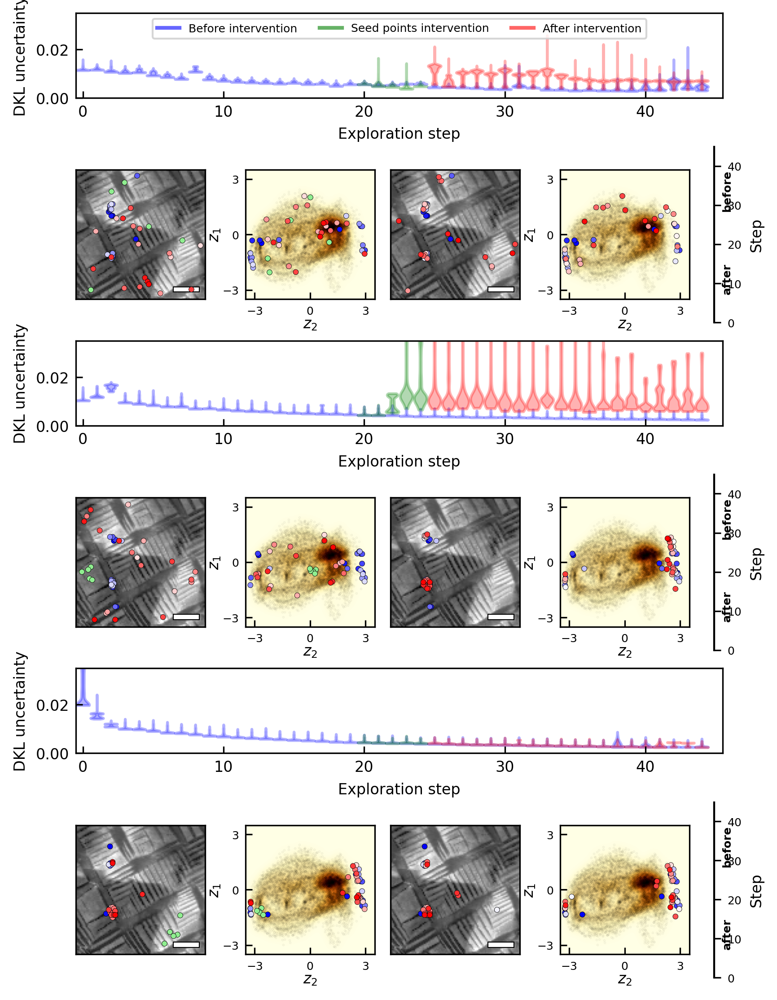

In [60]:
import matplotlib.gridspec as gridspec
import matplotlib.patches as patches
#from matplotlib import _layoutbox
import matplotlib as mpl

exploration_steps, int_len, int_step = params

cmap = plt.cm.get_cmap('bwr')
colors = [cmap(x) for x in np.linspace(0, 1, 45)]

s = np.arange(exploration_steps + int_len)

#ruler real space
scalebare = 600
length = scalebare * scale
height = length/5
origin = 0.75*amp.shape[0], 0.05*amp.shape[1]



fig = plt.figure(figsize=(6.2, 9.3), dpi = 300)
gs = gridspec.GridSpec(9, 7,
                       width_ratios=[ 1.45, 0.1, 1.45,  1.45, 0.1, 1.45, 0.2],
                       height_ratios=[0.7, 0.1, 1.45, 0.7, 0.1, 1.45, 0.7, 0.1, 1.45])

#violine plot
for i in range(3):
  ax = fig.add_subplot(gs[i*3, :])

  vp = ax.violinplot(m_v_without[i], s, showextrema = False, showmeans=False, widths=0.9)
  violine_param(vp, range=[0,45], facecolor='blue', edgecolor='blue')

  vp1 = ax.violinplot(m_v_after[i], s[25:], showextrema = False, showmeans=False, widths=0.9)
  violine_param(vp1, range=[0,45], facecolor='red', edgecolor='red')

  vp2 = ax.violinplot(m_v_inter[i], s[20:25], showextrema = False, showmeans=False, widths=0.9)
  violine_param(vp2, range=[0,45], facecolor='green', edgecolor='green')

  ax.set_xlim(-0.5, 45.5)
  ax.set_ylim(0, 0.035)
  ax.tick_params('both', direction='in', labelsize=8)
  #ax.text(x=1, y=0.023, s=acq_funcs[i], fontsize=8, fontweight='bold')
  ax.set_xlabel('Exploration step', fontsize=8,)

  ax.set_ylabel('DKL uncertainty', fontsize=8,)

  if i ==0:
      legend_labels = ['Before intervention', 'Seed points intervention', 'After intervention']
      legend_colors = ['blue', 'green', 'red']
      legend_elements = [plt.Line2D([0], [0],
                                    color=legend_colors[i],
                                    lw=2,
                                    label=legend_labels[i],
                                    alpha=0.6) for i in range(3)]

      ax.legend(handles=legend_elements, loc='upper center',fontsize=6, ncol=3)


#_____________ real space ___________________

for i in range(3):
  for j in range(2):
    ax = plt.subplot(gs[i*3+2,j*3], aspect=1)
    ax.imshow(pola, cmap='gray', origin = "lower",)
    ax.tick_params('both', direction='in', labelsize=8)
    ax.set_xticks([])
    ax.set_yticks([])

    ax.add_patch(patches.Rectangle(origin, length, height, color = 'white', ec='k', lw=0.5, fill = True))

    tr0, tr1 = trajj[j][i][0], trajj[j][i][1]

    if j == 1:
      im1 = ax.scatter(tr1, tr0, s=8, c = colors, edgecolors='black', linewidths=0.2)
    if j == 0:
      im1 = ax.scatter(tr1[:20],   tr0[:20],   s=8, c = colors[:20], edgecolors='black', linewidths=0.2)
      im1 = ax.scatter(tr1[20:25], tr0[20:25], s=8, c = 'lightgreen', edgecolors='black', linewidths=0.2)
      im1 = ax.scatter(tr1[25:],   tr0[25:],   s=8, c = colors[25:], edgecolors='black', linewidths=0.2)

#_____________ latent space ___________________
for i in range(3):
  for j in range(2):
    ax = plt.subplot(gs[i*3+2,j*3+2], aspect=1)
    ax.scatter(z1, z2, s=0.1, c='black', alpha=0.05)
    ax.imshow(np.rot90(gaussian), cmap='YlOrBr',
              extent=[z1min-ext, z1max+ext, z2min-ext, z2max+ext])
    ax.tick_params('both', direction='in', labelsize=6)
    ax.set_xlim(-3.5,3.5)
    ax.set_ylim(-3.5,3.5)
    ax.set_xticks([-3,0,3])
    ax.set_yticks([-3,0,3])
    ax.set_xlabel("$z_2$", fontsize=8, labelpad=0.01)
    ax.set_ylabel("$z_1$", fontsize=8, labelpad=0.01)

    z1_, z2_ = z1[idxx[j][i]], z2[idxx[j][i]]
    if j==1:
      im2 = ax.scatter(z1_, z2_, s=8, c = colors, edgecolors='black', linewidths=0.2)

    if j==0:
      im2 = ax.scatter(z1_[:20], z2_[:20], s=8, c = colors[:20], edgecolors='black', linewidths=0.2)
      im2 = ax.scatter(z1_[20:25], z2_[20:25], s=8, c = 'lightgreen', edgecolors='black', linewidths=0.2)
      im2 = ax.scatter(z1_[25:], z2_[25:], s=8, c = colors[25:], edgecolors='black', linewidths=0.2)


#_____________ colorbar ___________________
for i in range(3):
  ax = plt.subplot(gs[i*3+2,-1], aspect=7.25)
  ax.set_yticks([])
  ax.set_xticks([])
  cb = fig.colorbar(mpl.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=0,vmax=45), cmap='bwr'), cax=ax)
  cb.ax.tick_params(labelsize=6)
  cb.set_label('Step', fontsize=8)
  cb.ax.axhline(22.5, color='lightgreen', linewidth=5)
  cb.ax.text(25, 33.75, 'before', rotation=90, va='center', ha='center', fontsize=6, color='black', fontweight='bold')
  cb.ax.text(25, 11.25, 'after', rotation=90, va='center', ha='center', fontsize=6, color='black', fontweight='bold')
